In [2]:
# Filter pout the warings

import warnings
warnings.filterwarnings('ignore')

In [3]:
# import the reuired libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',None)
pd.set_option('float_format', '{:f}'.format)

### <font color="red">Data Sourcing : Routine Checks</font> 

In [6]:
# import the application data
application = pd.read_csv('application_data.csv')

In [7]:
# read the previous applicaton data
previous_application = pd.read_csv('previous_application.csv')

In [8]:
# Check the number of rows and columns
application.shape

(307511, 122)

In [9]:
#Get the basic info of the dataset
application.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    307511 non-null  int64  
 1   TARGET                        307511 non-null  int64  
 2   NAME_CONTRACT_TYPE            307511 non-null  object 
 3   CODE_GENDER                   307511 non-null  object 
 4   FLAG_OWN_CAR                  307511 non-null  object 
 5   FLAG_OWN_REALTY               307511 non-null  object 
 6   CNT_CHILDREN                  307511 non-null  int64  
 7   AMT_INCOME_TOTAL              307511 non-null  float64
 8   AMT_CREDIT                    307511 non-null  float64
 9   AMT_ANNUITY                   307499 non-null  float64
 10  AMT_GOODS_PRICE               307233 non-null  float64
 11  NAME_TYPE_SUITE               306219 non-null  object 
 12  NAME_INCOME_TYPE              307511 non-nu

In [10]:
# Check for the number of columsn having missing values
missing_application = application.isnull().sum()
print(len(missing_application))
missing_application_50 = missing_application[missing_application.values>=(0.5*len(missing_application))]
print(len(missing_application_50))

122
64


In [11]:
# Sneak peak of the statistics of the data
application.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,...,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307499.000000,307233.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,306851.000000,246546.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,...,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,168797.919297,599025.999706,27108.573909,538396.207429,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,0.514393,0.510853,0.117440,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,...,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.977752,0.755746,0.044595,0.078078,0.149213,0.225897,0.231625,0.067169,0.101954,0.108607,0.008651,0.028236,0.102547,1.422245,0.143421,1.405292,0.100049,-962.858788,0.000042,0.710023,0.000081,0.015115,0.088055,0.

In [12]:
# Check the data structure 
application.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,...,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.000000,406597.500000,24700.500000,351000.000000,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.000000,-2120,nan,1,1,0,1,1,0,Laborers,1.000000,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.024700,0.036900,0.972200,0.619200,0.014300,0.000000,...,0.025000,0.036900,0.972200,0.624300,0.014400,0.000000,0.069000,0.083300,0.125000,0.037500,0.020500,0.019300,0.000000,0.000000,reg oper account,block of flats,0.014900,"Stone, brick",No,2.000000,2.000000,2.000000,2.000000,-1134.000000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
1,100003,0,Cash loans,F,N,N,0,270000.000000,1293502.500000,35698.500000,1129500.000000,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.000000,-291,nan,1,1,0,1,1,0,Core staff,2.000000,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,nan,0.095900,0.052900,0.985100,0.796000,0.060500,0.080000,...,0.096800,0.052900,0.985100,0.798700,0.060800,0.080000,0.034500,0.291700,0.333300,0.013200,0.078700,0.055800,0.003900,0.010000,reg oper account,block of flats,0.071400,Block,No,1.000000,0.000000,1.000000,0.000000,-828.000000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,100004,0,Revolving loans,M,Y,Y,0,67500.000000,135000.000000,6750.000000,135000.000000,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.000000,-2531,26.000000,1,1,1,1,1,0,Laborers,1.000000,2,2,MONDAY,9,0,0,0,0,0,0,Government,nan,0.555912,0.729567,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,NaN,nan,NaN,NaN,0.000000,0.000000,0.000000,0.000000,-815.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,100006,0,Cash loans,F,N,Y,0,135000.000000,312682.500000,29686.500000,297000.000000,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.000000,-2437,nan,1,1,0,1,0,0,Laborers,2.000000

There are 3L plus records of information on 122 variables

There are 19 Categorical type (Object) and 106 columns with integer and float data types

From basic statistical view 8% of the clients have difficulty in repayment

There are 122 columns with missing values of which 64 columns having >=50% of missing values

### Quality check : Handling of missing values

In [13]:
application.index

RangeIndex(start=0, stop=307511, step=1)

In [14]:
# Fidning the percentage of missing values in all columns
appli_missing_values = round(application.isnull().sum()/len(application.index), 4)*100
print(appli_missing_values.sort_values(ascending = False))

COMMONAREA_MEDI                69.870000
COMMONAREA_AVG                 69.870000
COMMONAREA_MODE                69.870000
NONLIVINGAPARTMENTS_MODE       69.430000
NONLIVINGAPARTMENTS_MEDI       69.430000
NONLIVINGAPARTMENTS_AVG        69.430000
FONDKAPREMONT_MODE             68.390000
LIVINGAPARTMENTS_MEDI          68.350000
LIVINGAPARTMENTS_MODE          68.350000
LIVINGAPARTMENTS_AVG           68.350000
FLOORSMIN_MEDI                 67.850000
FLOORSMIN_MODE                 67.850000
FLOORSMIN_AVG                  67.850000
YEARS_BUILD_MEDI               66.500000
YEARS_BUILD_AVG                66.500000
YEARS_BUILD_MODE               66.500000
OWN_CAR_AGE                    65.990000
LANDAREA_MODE                  59.380000
LANDAREA_AVG                   59.380000
LANDAREA_MEDI                  59.380000
BASEMENTAREA_MEDI              58.520000
BASEMENTAREA_AVG               58.520000
BASEMENTAREA_MODE              58.520000
EXT_SOURCE_1                   56.380000
NONLIVINGAREA_ME

#### Drop the columns with >=50% missing values 

In [15]:
#Find out the columns with missing values >= 50%
appli_missing_values[appli_missing_values.between(50,100)]
print(len(appli_missing_values[appli_missing_values.between(50,100)]))
print(appli_missing_values[appli_missing_values.between(50,100)].sort_values(ascending = False))

# 41 columns with missing data more than 50%, Commonarea columns topping the list

41
COMMONAREA_AVG             69.870000
COMMONAREA_MEDI            69.870000
COMMONAREA_MODE            69.870000
NONLIVINGAPARTMENTS_MODE   69.430000
NONLIVINGAPARTMENTS_MEDI   69.430000
NONLIVINGAPARTMENTS_AVG    69.430000
FONDKAPREMONT_MODE         68.390000
LIVINGAPARTMENTS_MEDI      68.350000
LIVINGAPARTMENTS_AVG       68.350000
LIVINGAPARTMENTS_MODE      68.350000
FLOORSMIN_MODE             67.850000
FLOORSMIN_AVG              67.850000
FLOORSMIN_MEDI             67.850000
YEARS_BUILD_AVG            66.500000
YEARS_BUILD_MEDI           66.500000
YEARS_BUILD_MODE           66.500000
OWN_CAR_AGE                65.990000
LANDAREA_MODE              59.380000
LANDAREA_MEDI              59.380000
LANDAREA_AVG               59.380000
BASEMENTAREA_AVG           58.520000
BASEMENTAREA_MEDI          58.520000
BASEMENTAREA_MODE          58.520000
EXT_SOURCE_1               56.380000
NONLIVINGAREA_AVG          55.180000
NONLIVINGAREA_MODE         55.180000
NONLIVINGAREA_MEDI         55.18000

In [16]:
# Check the count of columns before dropping the columns with mssing values more than 50%
application.shape

(307511, 122)

In [17]:
# Drop the columns having more than 50% missing values. From the query above 
# we have identified such columns which need be dropped 
application.drop(application.columns[appli_missing_values.between(50,100)],axis=1,inplace=True)

In [18]:
# Recheck the number of columns post dropping the 41 columns
application.shape

(307511, 81)

#### Identify the best metric to fill the missing values for columns with < 13% missing values

In [19]:
# Check for the columns with missing values <= 13%
appli_missing_values = round(application.isnull().sum()/len(application.index), 4)*100
print(appli_missing_values.sort_values(ascending = False))

# Since AMT_REQ_CREDIT columns are having 13.5 minssing columns and all others less than 1% 
# we will consider this column even though it is little higher than the 13%

FLOORSMAX_AVG                  49.760000
FLOORSMAX_MEDI                 49.760000
FLOORSMAX_MODE                 49.760000
YEARS_BEGINEXPLUATATION_AVG    48.780000
YEARS_BEGINEXPLUATATION_MEDI   48.780000
YEARS_BEGINEXPLUATATION_MODE   48.780000
TOTALAREA_MODE                 48.270000
EMERGENCYSTATE_MODE            47.400000
OCCUPATION_TYPE                31.350000
EXT_SOURCE_3                   19.830000
AMT_REQ_CREDIT_BUREAU_YEAR     13.500000
AMT_REQ_CREDIT_BUREAU_QRT      13.500000
AMT_REQ_CREDIT_BUREAU_HOUR     13.500000
AMT_REQ_CREDIT_BUREAU_DAY      13.500000
AMT_REQ_CREDIT_BUREAU_WEEK     13.500000
AMT_REQ_CREDIT_BUREAU_MON      13.500000
NAME_TYPE_SUITE                 0.420000
DEF_60_CNT_SOCIAL_CIRCLE        0.330000
OBS_30_CNT_SOCIAL_CIRCLE        0.330000
DEF_30_CNT_SOCIAL_CIRCLE        0.330000
OBS_60_CNT_SOCIAL_CIRCLE        0.330000
EXT_SOURCE_2                    0.210000
AMT_GOODS_PRICE                 0.090000
FLAG_DOCUMENT_5                 0.000000
NAME_FAMILY_STAT

In [20]:
# Get the only those columns having <=13% 
# (we are cosidering even the columns AMT_REQ_CREDIT as they are around 13% with 13.5% missing values in each)

appli_missing_values[appli_missing_values.between(0.01,15)]
print(len(appli_missing_values[appli_missing_values.between(0.01,15)]))
print(appli_missing_values[appli_missing_values.between(0.01,15)].sort_values(ascending = False))

13
AMT_REQ_CREDIT_BUREAU_YEAR   13.500000
AMT_REQ_CREDIT_BUREAU_QRT    13.500000
AMT_REQ_CREDIT_BUREAU_MON    13.500000
AMT_REQ_CREDIT_BUREAU_WEEK   13.500000
AMT_REQ_CREDIT_BUREAU_DAY    13.500000
AMT_REQ_CREDIT_BUREAU_HOUR   13.500000
NAME_TYPE_SUITE               0.420000
DEF_60_CNT_SOCIAL_CIRCLE      0.330000
OBS_60_CNT_SOCIAL_CIRCLE      0.330000
DEF_30_CNT_SOCIAL_CIRCLE      0.330000
OBS_30_CNT_SOCIAL_CIRCLE      0.330000
EXT_SOURCE_2                  0.210000
AMT_GOODS_PRICE               0.090000
dtype: float64


In [21]:
# Check if the columns having missing values less than 14% are Categorical or Continuous
# helping us to decide on the best logic for imputation

application[['AMT_REQ_CREDIT_BUREAU_YEAR','EXT_SOURCE_2','AMT_GOODS_PRICE','NAME_TYPE_SUITE','OBS_30_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE']].nunique().sort_values(ascending = False)


EXT_SOURCE_2                  119831
AMT_GOODS_PRICE                 1002
OBS_30_CNT_SOCIAL_CIRCLE          33
AMT_REQ_CREDIT_BUREAU_YEAR        25
DEF_60_CNT_SOCIAL_CIRCLE           9
NAME_TYPE_SUITE                    7
dtype: int64

In [22]:
# i. NAME_TYPE_SUITE : 
# in the results from the above query it is categorical in nature
# it accounts for less than 1% of the missing values
# Lets find the values that we have in this column

application['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

For a categorical column one best way to impute, is to use mode value for imputation
'Unaccompanied' value is 81% we can safely impute the mmissing data with this value

In [23]:
# ii. AMT_GOODS_PRICE : 
# in the results from the above query it is continuous in nature
# it accounts for less than 1% of the missing values
# Lets find the values that we have in this column

application['AMT_GOODS_PRICE'].value_counts()

450000.000000     26022
225000.000000     25282
675000.000000     24962
900000.000000     15416
270000.000000     11428
180000.000000     10123
454500.000000      9157
1125000.000000     9050
135000.000000      8206
315000.000000      5225
1350000.000000     5037
679500.000000      4824
238500.000000      4696
360000.000000      4553
247500.000000      4318
463500.000000      3873
540000.000000      3763
495000.000000      3463
202500.000000      3222
90000.000000       3169
405000.000000      2954
472500.000000      2828
157500.000000      2704
585000.000000      2647
337500.000000      2501
229500.000000      2438
112500.000000      2170
630000.000000      2164
1800000.000000     2146
720000.000000      1922
1575000.000000     1875
688500.000000      1824
292500.000000      1708
148500.000000      1674
477000.000000      1611
810000.000000      1568
67500.000000       1505
697500.000000      1408
382500.000000      1396
765000.000000      1396
904500.000000      1375
283500.000000   

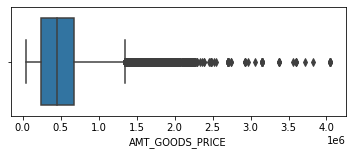

In [24]:
# since it is a continuous datatype better to sue either mean of median to impute values
# mean is good if we do not have any outliers mode when there are outliers
# Check for outliers
plt.figure(figsize = (6, 2))
sns.boxplot(application.AMT_GOODS_PRICE)
plt.show()


From the graph belowe we see that there are too many outliers hence better to use medium value for imputation

In [25]:
# Simce we have many outliers better to use median for imputation
# find the median for AMT_GOODS_PRICE

application['AMT_GOODS_PRICE'].median()


450000.0

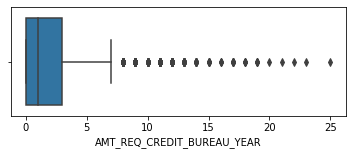

In [26]:
# iii. AMT_REQ_CREDIT_BUREAU_YEAR : infact all the columns under AMT_REQ_CREDIT i.e the number ommquired on client with Credit Bureau

# From the nature of the values we could consider this as a contuious datatype
# we should check if there are any outliers if yes then use median or use mean

plt.figure(figsize = (6, 2))
sns.boxplot(application.AMT_REQ_CREDIT_BUREAU_YEAR)
plt.show()

In [27]:
# Since there are outliers better to use median than mean

application['AMT_REQ_CREDIT_BUREAU_YEAR'].median()

1.0

Since there are outliers better to use median than mean i.e. '1' in this case

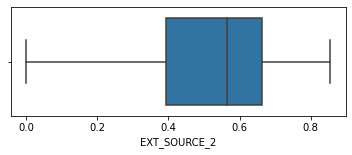

In [28]:
# iv. EXT_SOURCE_2

# From the nature of the values we could consider this as a contuious datatype
# we should check if there are any outliers if yes then use median or use mean

plt.figure(figsize = (6, 2))
sns.boxplot(application.EXT_SOURCE_2)
plt.show()

In [29]:
# Since there are no outliers the best method is to use mean

application['EXT_SOURCE_2'].mean()

0.5143926741308463

Since there are no outliers the best method is to use mean i.e. 0.52

In [30]:
# v DEF_60_CNT_SOCIAL_CIRCLE

# From the nature of the values we could consider this as a categorical datatype
# We could go with imputing using mode values

# Check the values with theiir count

application['DEF_60_CNT_SOCIAL_CIRCLE'].value_counts()

# Since the mdoe is '0' we could use this to impute

0.000000     280721
1.000000      21841
2.000000       3170
3.000000        598
4.000000        135
5.000000         20
6.000000          3
24.000000         1
7.000000          1
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: int64

Since the mdoe is '0' we could use this to impute

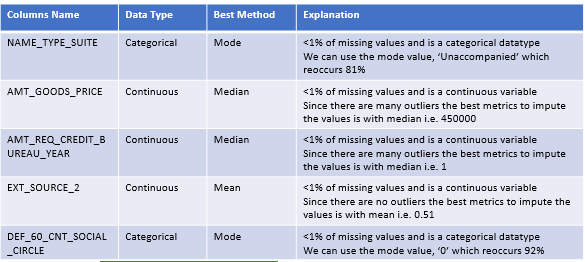

### Indentify the datatypes and chnage them to relevant datatypes

##### Logic
To identify the columns if they are continuous or categorical we could use their uniq counts and 
consider the columns with unique counts less than or equal 40 as categorical else continuous

In [31]:
# Find the unique counts
application.nunique().sort_values(ascending = False)

# With the logic mentioned above there are 52 columns with default data type as numeric however belong to categorical datatype
# All other calumns with unique count of values greater than 40 are of either int or float data type except for
# ORGANIZATION_TYPE : by nature it is categorical hence not required to be changed to float or integer

SK_ID_CURR                      307511
EXT_SOURCE_2                    119831
DAYS_BIRTH                       17460
DAYS_REGISTRATION                15688
AMT_ANNUITY                      13672
DAYS_EMPLOYED                    12574
DAYS_ID_PUBLISH                   6168
AMT_CREDIT                        5603
TOTALAREA_MODE                    5116
DAYS_LAST_PHONE_CHANGE            3773
AMT_INCOME_TOTAL                  2548
AMT_GOODS_PRICE                   1002
EXT_SOURCE_3                       814
FLOORSMAX_AVG                      403
YEARS_BEGINEXPLUATATION_AVG        285
YEARS_BEGINEXPLUATATION_MEDI       245
YEARS_BEGINEXPLUATATION_MODE       221
REGION_POPULATION_RELATIVE          81
ORGANIZATION_TYPE                   58
FLOORSMAX_MEDI                      49
OBS_30_CNT_SOCIAL_CIRCLE            33
OBS_60_CNT_SOCIAL_CIRCLE            33
FLOORSMAX_MODE                      25
AMT_REQ_CREDIT_BUREAU_YEAR          25
AMT_REQ_CREDIT_BUREAU_MON           24
HOUR_APPR_PROCESS_START  

In [32]:
# Get the default data types of all columns

application.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 81 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    307511 non-null  int64  
 1   TARGET                        307511 non-null  int64  
 2   NAME_CONTRACT_TYPE            307511 non-null  object 
 3   CODE_GENDER                   307511 non-null  object 
 4   FLAG_OWN_CAR                  307511 non-null  object 
 5   FLAG_OWN_REALTY               307511 non-null  object 
 6   CNT_CHILDREN                  307511 non-null  int64  
 7   AMT_INCOME_TOTAL              307511 non-null  float64
 8   AMT_CREDIT                    307511 non-null  float64
 9   AMT_ANNUITY                   307499 non-null  float64
 10  AMT_GOODS_PRICE               307233 non-null  float64
 11  NAME_TYPE_SUITE               306219 non-null  object 
 12  NAME_INCOME_TYPE              307511 non-nul

#### Change thee data type of 10 columns whose default category mismatches considering the logic mentioned above

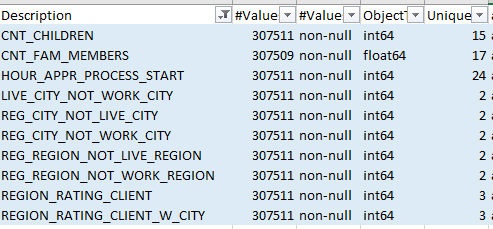

In [33]:
# Change the datatypes of the above to string
# Note that the datatype changes are made based purely on the logic the tutor has mentioned in the session else few 
# datatype changing might differ from this E: CNT_FAM_Members could be changed from float64 to intger as that helps in
# performing mathematical operations AND
# Columns like REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY to boolean types

#application['CNT_CHILDREN'] = application['CNT_CHILDREN'].astype(str)
application['CNT_FAM_MEMBERS'] = application['CNT_FAM_MEMBERS'].astype(str)
application['HOUR_APPR_PROCESS_START'] = application['HOUR_APPR_PROCESS_START'].astype(str)
application['LIVE_CITY_NOT_WORK_CITY'] = application['LIVE_CITY_NOT_WORK_CITY'].astype(str)
application['REG_CITY_NOT_LIVE_CITY'] = application['REG_CITY_NOT_LIVE_CITY'].astype(str)
application['REG_CITY_NOT_WORK_CITY'] = application['REG_CITY_NOT_WORK_CITY'].astype(str)
application['REG_REGION_NOT_LIVE_REGION'] = application['REG_REGION_NOT_LIVE_REGION'].astype(str)
application['REG_REGION_NOT_WORK_REGION'] = application['REG_REGION_NOT_WORK_REGION'].astype(str)
application['REGION_RATING_CLIENT'] = application['REGION_RATING_CLIENT'].astype(str)
application['REGION_RATING_CLIENT_W_CITY'] = application['REGION_RATING_CLIENT_W_CITY'].astype(str)

In [34]:
# Verify if the datatypes have changed as intended

application.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 81 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    307511 non-null  int64  
 1   TARGET                        307511 non-null  int64  
 2   NAME_CONTRACT_TYPE            307511 non-null  object 
 3   CODE_GENDER                   307511 non-null  object 
 4   FLAG_OWN_CAR                  307511 non-null  object 
 5   FLAG_OWN_REALTY               307511 non-null  object 
 6   CNT_CHILDREN                  307511 non-null  int64  
 7   AMT_INCOME_TOTAL              307511 non-null  float64
 8   AMT_CREDIT                    307511 non-null  float64
 9   AMT_ANNUITY                   307499 non-null  float64
 10  AMT_GOODS_PRICE               307233 non-null  float64
 11  NAME_TYPE_SUITE               306219 non-null  object 
 12  NAME_INCOME_TYPE              307511 non-nul

#### Binning of the categorical variables : For two variables

In [35]:
# Look at the statistics of the income group to decide the binnning values
application['AMT_INCOME_TOTAL'].describe()

count      307511.000000
mean       168797.919297
std        237123.146279
min         25650.000000
25%        112500.000000
50%        147150.000000
75%        202500.000000
max     117000000.000000
Name: AMT_INCOME_TOTAL, dtype: float64

In [36]:
# Binning of the customers based on income
application['AMT_INCOME_TOTAL_BIN']=pd.cut(application['AMT_INCOME_TOTAL'],[0,125000,250000,500000],labels=['LOW','MEDIUM','HIGH'])
application['AMT_INCOME_TOTAL_BIN']

0         MEDIUM
1           HIGH
2            LOW
3         MEDIUM
4            LOW
5            LOW
6         MEDIUM
7           HIGH
8            LOW
9         MEDIUM
10           LOW
11           LOW
12           LOW
13        MEDIUM
14        MEDIUM
15        MEDIUM
16           LOW
17           LOW
18           LOW
19           LOW
20        MEDIUM
21        MEDIUM
22          HIGH
23           LOW
24        MEDIUM
25           LOW
26           LOW
27           LOW
28          HIGH
29           LOW
30          HIGH
31           LOW
32           LOW
33          HIGH
34        MEDIUM
35           LOW
36        MEDIUM
37           LOW
38           LOW
39        MEDIUM
40        MEDIUM
41        MEDIUM
42        MEDIUM
43           LOW
44        MEDIUM
45           LOW
46        MEDIUM
47           LOW
48        MEDIUM
49          HIGH
50           LOW
51           NaN
52           LOW
53        MEDIUM
54           LOW
55        MEDIUM
56           LOW
57           LOW
58          HI

In [37]:
# Look at the statistics of the income group to decide the binnning values
application['DAYS_BIRTH'].describe()

count   307511.000000
mean    -16036.995067
std       4363.988632
min     -25229.000000
25%     -19682.000000
50%     -15750.000000
75%     -12413.000000
max      -7489.000000
Name: DAYS_BIRTH, dtype: float64

In [38]:
#Creating bins for age 
application['DAYS_BIRTH_BIN']=pd.cut(application['DAYS_BIRTH'],[-30000,-20000,-12000,0],labels=['OLD','MIDDLE','YOUNG'])
application['DAYS_BIRTH_BIN']

0          YOUNG
1         MIDDLE
2         MIDDLE
3         MIDDLE
4         MIDDLE
5         MIDDLE
6         MIDDLE
7         MIDDLE
8            OLD
9         MIDDLE
10         YOUNG
11           OLD
12        MIDDLE
13        MIDDLE
14        MIDDLE
15         YOUNG
16        MIDDLE
17         YOUNG
18        MIDDLE
19         YOUNG
20        MIDDLE
21        MIDDLE
22         YOUNG
23           OLD
24         YOUNG
25        MIDDLE
26        MIDDLE
27        MIDDLE
28         YOUNG
29         YOUNG
30        MIDDLE
31         YOUNG
32        MIDDLE
33         YOUNG
34        MIDDLE
35        MIDDLE
36        MIDDLE
37           OLD
38           OLD
39        MIDDLE
40        MIDDLE
41        MIDDLE
42        MIDDLE
43           OLD
44         YOUNG
45         YOUNG
46           OLD
47           OLD
48        MIDDLE
49        MIDDLE
50        MIDDLE
51        MIDDLE
52        MIDDLE
53         YOUNG
54        MIDDLE
55        MIDDLE
56           OLD
57        MIDDLE
58        MIDD

### Treatment of Outliers

The columns identifed for analysisng the outliers are as below

AMT_ANNUITY, AMT_GOODS_PRICE, AMT_INCOME_TOTAL, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, CNT_CHILDREN,
DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION

As per the instructions no treatment given but just the sugestions given

In [39]:
# Check the statistics of the chosen variables
application[['AMT_ANNUITY','AMT_GOODS_PRICE','AMT_INCOME_TOTAL','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','CNT_CHILDREN','DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION']].describe().T

,count,mean,std,min,25%,50%,75%,max
AMT_ANNUITY,307499.000000,27108.573909,14493.737315,1615.500000,16524.000000,24903.000000,34596.000000,258025.500000
AMT_GOODS_PRICE,307233.000000,538396.207429,369446.460540,40500.000000,238500.000000,450000.000000,679500.000000,4050000.000000
AMT_INCOME_TOTAL,307511.000000,168797.919297,237123.146279,25650.000000,112500.000000,147150.000000,202500.000000,117000000.000000
AMT_REQ_CREDIT_BUREAU_MON,265992.000000,0.267395,0.916002,0.000000,0.000000,0.000000,0.000000,27.000000
AMT_REQ_CREDIT_BUREAU_QRT,265992.000000,0.265474,0.794056,0.000000,0.000000,0.000000,0.000000,261.000000
CNT_CHILDREN,307511.000000,0.417052,0.722121,0.000000,0.000000,0.000000,1.000000,19.000000
DAYS_BIRTH,307511.000000,-16036.995067,4363.988632,-25229.000000,-19682.000000,-15750.000000,-12413.000000,-7489.000000
DAYS_EMPLOYED,307511.000000,63815.045904,141275.766519,-17912.000000,-2760.000000,-1213.000000,-289.000000,365243.000000
DAYS_REGISTRATION,307511.000000,-4986.120328,3522.886321,-24672.000000,-7479.500000,-4504.000000,-2010.000000,0.000000


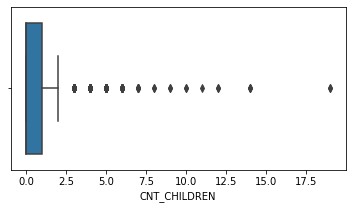

In [40]:
# identify the outliers by generating boxplot
plt.figure(figsize = (6,3))
sns.boxplot(application['CNT_CHILDREN'])
plt.show()

Children Count (CNT_CHILDERN) : There huge outliers in the children count. Even the first child is at 75th percentile. Clients upto 75th percentile do not have children. Also unusual data or more than 5 children till 19 children for a client which is not practical and might be a human error

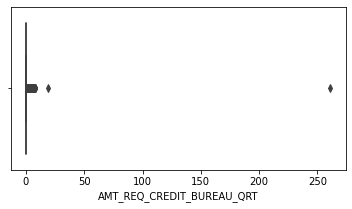

In [41]:
# identify the outliers by generating boxplot
plt.figure(figsize = (6,3))
sns.boxplot(application['AMT_REQ_CREDIT_BUREAU_QRT'])
plt.show()

Queries to Credit Bureau (AMT_REQ_CREDIT_BUREAU_QRT) : It is just next to impossible to have 250+ inquires on a client within three months time. It might be a human error
From the graph you can observe that even the 1 inquiry is at almost near 90th percentile
Most of the people hence do not have any inquiries in last 3 months

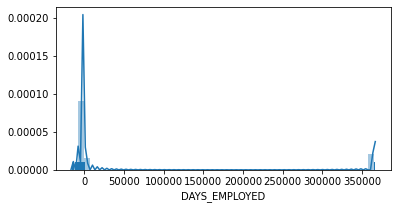

In [42]:
#looking for outlier for 'DAYS_EMPLOYED'
plt.figure(figsize=(6,3))
sns.distplot(application['DAYS_EMPLOYED'][:1000], rug=True)
plt.show()

Work Experience (DAYS_EMPLOYED) : The nature of this column is that we should have only negative values as the experience is counted on the past days. We have a value 365243 repeated around 55k times. This for sure is a human error

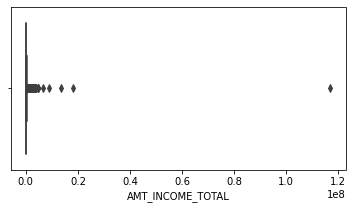

In [45]:
# CHECKING FOR OUTLIER IN AMT_INCOME_TOTAL
plt.figure(figsize=(6,3))
sns.boxplot(application['AMT_INCOME_TOTAL'])
plt.show()

Client Income (AMT_INCOME_TOTAL) : We could see that the values way beyond the 75th percentile. There for sure there is an outlier. Unless the same is not considered we cannot get the true value of the population as the outlier is not a great representation of the population  

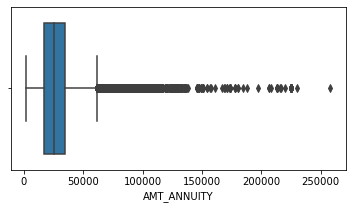

In [46]:
# CHECKING FOR OUTLIER IN AMT_ANNUITY
plt.figure(figsize=(6,3))
sns.boxplot(application['AMT_ANNUITY'])
plt.show()

The 75% percentile also is below 50k howwver the maximum value of annuity is above 250000. There are many outliers in the Annuity which need to be considered t be handled in the beest possible way during analysis

### <font color="red">Analysis</font>

#### Data Imbalance

In [47]:
## Traget data is the key coum providing information on if the client had difficulty in repayment
# Do a routine checks on this column

print(application["TARGET"].value_counts())

0    282686
1     24825
Name: TARGET, dtype: int64


In [48]:
# Calculate the percentge of default and no difficulty in default
# 0 is non default and 1 is default

100*application.TARGET.value_counts(normalize = True)

0   91.927118
1    8.072882
Name: TARGET, dtype: float64

#### <font color="red">Imbalance Ratio is 91.93 : 8.07</font>

For "TARGET" Class, we are having a huge data imbalence for '0' - Non-Defaulters and '1' - Defaulters
- Non-Defaulters : 92% data
- Defaulters : 8% data

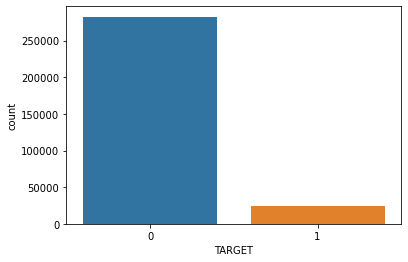

In [49]:
# Visualise the imbalance ratio using a graph with the values from the table directly
plt.figure(figsize=(6,4))
sns.countplot(x="TARGET", data=application)
plt.show()

# Imbalance Ratio is - 91.93 : 8.07

In [50]:
#Split the data intoo two dataframes, one for non defaulaters and the other for defaulters
# df0 = non defaulters and df1 = defaulters data set

df0 = application[application['TARGET']== 0]
df1 = application[application['TARGET']== 1]

In [51]:
df0.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,LIVE_REGION_NOT_WORK_REGION,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282674.000000,282429.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282078.000000,227398.000000,146487.000000,143730.000000,146487.000000,143730.000000,146487.000000,143730.000000,147961.000000,281701.000000,281701.000000,281701.000000,281701.000000,282685.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,245459.000000,245459.000000,245459.000000,245459.000000,245459.000000,245459.000000
mean,278244.744536,0.000000,0.412946,169077.722266,602648.282002,27163.623349,542736.795003,0.021021,-16138.176397,65696.146123,-5029.941065,-3017.219788,0.999996,0.814653,0.195991,0.998129,0.284238,0.056840,0.040494,0.523479,0.520969,0.977893,0.228023,0.977225,0.224015,0.977916,0.227634,0.103507,1.415742,0.139148,1.398923,0.096688,-976.388294,0.000032,0.704060,0.000088,0.015126,0.090457,0.000198,0.082027,0.003976,0.000025,0.003990,0.000007,0.003729,0.003088,0.001277,0.010269,0.000283,0.008341,0.000605,0.000506,0.000315,0.006380,0.006914,0.034315,0.270697,0.265939,1.889199
std,102825.776954,0.000000,0.718843,110476.268524,406845.907710,14658.307178,373785.493533,0.013978,4364.200856,142877.810161,3538.464478,1506.614090,0.001881,0.388579,0.396963,0.043219,0.451051,0.231538,0.197114,0.186277,0.190465,0.058406,0.145228,0.063821,0.144298,0.059055,0.145665,0.108043,2.402858,0.439768,2.381793,0.355771,831.210739,0.005642,0.456465,0.009404,0.122056,0.286836,0.014073,0.274407,0.062931,0.004976,0.063043,0.002660,0.060948,0.055486,0.035713,0.100816,0.016820,0.090950,0.024588,0.022486,0.017741,0.083759,0.111091,0.204747,0.928799,0.805355,1.863376
min,100003.000000,0.000000,0.000000,25650.000000,45000.000000,1615.500000,40500.000000,0.000290,-25229.000000,-17912.000000,-24672.000000,-7197.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000527,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189103.250000,0.000000,0.000000,112500.000000,270000.000000,16456.500000,238500.000000,0.010006,-19793.750000,-2813.000000,-7550.000000,-4313.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.409787,0.385915,0.976700,0.166700,0.976700,0.166700,0.976700,0.166700,0.041700,0.000000,0.000000,0.000000,0.000000,-1586.000000,0.000000,0.000000,0.0

In [52]:
df1.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,LIVE_REGION_NOT_WORK_REGION,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24804.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24773.000000,19148.000000,11017.000000,10761.000000,11017.000000,10761.000000,11017.000000,10761.000000,11119.000000,24789.000000,24789.000000,24789.000000,24789.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,20533.000000,20533.000000,20533.000000,20533.000000,20533.000000,20533.000000
mean,277449.167936,1.000000,0.463807,165611.760906,557778.527674,26481.744290,488972.412554,0.019131,-14884.828077,42394.675448,-4487.127009,-2732.099617,1.000000,0.879517,0.237825,0.998187,0.244955,0.055347,0.042538,0.410935,0.390717,0.975634,0.203021,0.974938,0.199612,0.975570,0.202692,0.089769,1.496147,0.191980,1.477672,0.138247,-808.796818,0.000161,0.777925,0.000000,0.014985,0.060705,0.000121,0.073958,0.002981,0.000000,0.003021,0.000000,0.001208,0.001208,0.000443,0.006042,0.000081,0.005720,0.000483,0.000524,0.000564,0.006672,0.008036,0.034919,0.227926,0.259923,2.028783
std,102383.123458,0.000000,0.756903,746676.959440,346433.235646,12450.676999,311636.495297,0.011905,4192.844583,119484.634253,3299.650241,1516.975313,0.000000,0.325532,0.425760,0.042538,0.430069,0.228662,0.201817,0.213107,0.205810,0.069148,0.134414,0.073849,0.133548,0.070114,0.134705,0.098530,2.378438,0.516524,2.355908,0.427645,758.090713,0.012693,0.415649,0.000000,0.121495,0.238793,0.010993,0.261707,0.054517,0.000000,0.054883,0.000000,0.034743,0.034743,0.021046,0.077499,0.008976,0.075416,0.021981,0.022878,0.023741,0.084926,0.106682,0.203941,0.745116,0.643789,1.934063
min,100002.000000,1.000000,0.000000,25650.000000,45000.000000,2722.500000,45000.000000,0.000533,-25168.000000,-16069.000000,-22928.000000,-6207.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000005,0.000527,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4070.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189555.000000,1.000000,0.000000,112500.000000,284400.000000,17361.000000,238500.000000,0.009630,-18037.000000,-2156.000000,-6646.000000,-4119.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.238568,0.223831,0.976200,0.125000,0.975700,0.125000,0.975700,0.125000,0.031600,0.000000,0.000000,0.000000,0.000000,-1301.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000

In [53]:
# Dropping of unwanted columns
# application.drop(['REGION_POPULATION_RELATIVE','REGION_RATING_CLIENT','WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START'],axis=1,inplace=True)

# application.drop(['AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK'],axis=1,inplace=True)

# application.drop(['EXT_SOURCE_2'],axis=1,inplace=True)

# application.drop(['OBS_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE'],axis=1,inplace=True)

# application.drop(['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21'],axis=1,inplace=True)

# application.drop(['FLAG_MOBIL','FLAG_EMAIL','FLAG_CONT_MOBILE'],axis=1,inplace=True)


#### univariate analysis

Continuous Variable & 
Categorical Variable

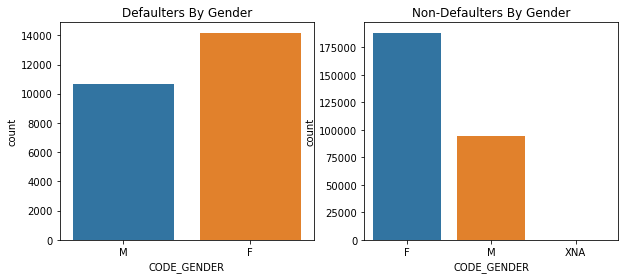

In [54]:
# Uni-Categorical - 1
# Influence of Gender on the repayment

plt.figure(figsize = (10, 4))
plt.subplot(1,2,1)
plt.title("Defaulters By Gender")
sns.countplot(df1['CODE_GENDER'])

plt.subplot(1,2,2)
plt.title("Non-Defaulters By Gender")
sns.countplot(df0['CODE_GENDER'])
plt.show()

Female clients top in both the defaulters list and non defaulter list, higher than that of male clients
Though in absolute numbers the female defaulters are high percentage wise they are lower than male defaulters. Only 7% of them have defaulted where as 10% of the male cleints ahve defaulted

In [55]:
# percentage of female defaulter
application['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [56]:
df1['CODE_GENDER'].value_counts()

F    14170
M    10655
Name: CODE_GENDER, dtype: int64

In [57]:
df0['CODE_GENDER'].value_counts()

F      188278
M       94404
XNA         4
Name: CODE_GENDER, dtype: int64

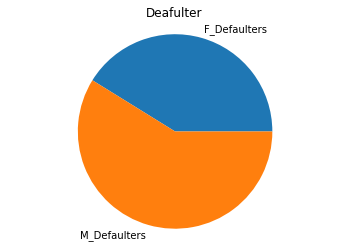

In [58]:
my_data = [7,10]
my_labels = 'F_Defaulters','M_Defaulters'
plt.pie(my_data,labels=my_labels)
plt.title('Deafulter')
plt.axis('equal')
plt.show()

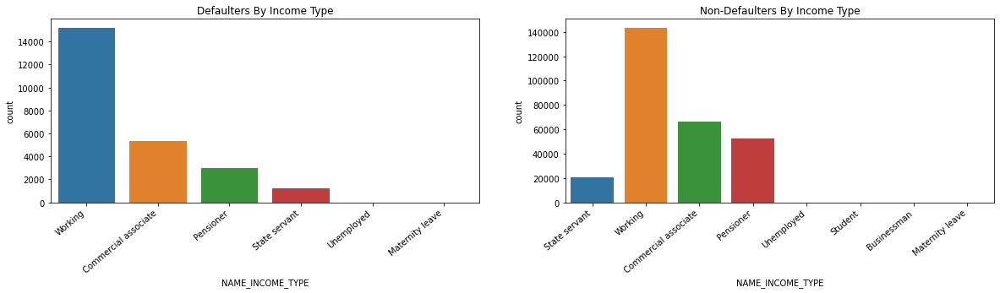

In [59]:
# Uni-Categorical - 2
# Influence of Income Type on the repayment

plt.figure(figsize = (20, 4))
plt.subplot(1,2,1)
plt.title("Defaulters By Income Type")
ax = sns.countplot(df1['NAME_INCOME_TYPE'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.subplot(1,2,2)
plt.title("Non-Defaulters By Income Type")
ax = sns.countplot(df0['NAME_INCOME_TYPE'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.show()

From absolute trend both defaulters and the non-defaulters by Income Type is the same

However when we look at the % of defaulters Matrniy Leave is the mst dangerous one, with 40% of defauletrs followed by Unemployed category defaulting 36%

Businessmen and Students are the most trustworhty clients with 100% repayment record

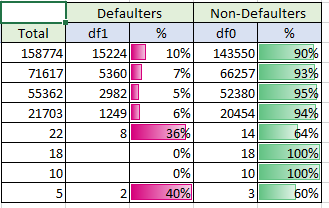



In [60]:
df1['NAME_INCOME_TYPE'].value_counts()

Working                 15224
Commercial associate     5360
Pensioner                2982
State servant            1249
Unemployed                  8
Maternity leave             2
Name: NAME_INCOME_TYPE, dtype: int64

In [61]:
df0['NAME_INCOME_TYPE'].value_counts()

Working                 143550
Commercial associate     66257
Pensioner                52380
State servant            20454
Student                     18
Unemployed                  14
Businessman                 10
Maternity leave              3
Name: NAME_INCOME_TYPE, dtype: int64

The trend of Income type on Deafulters and non- defaulters is the same

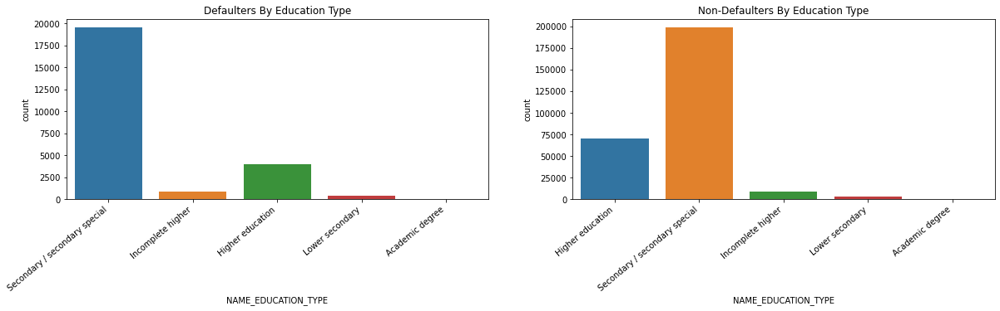

In [62]:
# Uni-Categorical - 3
# Influence of Education Type on the repayment

plt.figure(figsize = (20, 4))
plt.subplot(1,2,1)
plt.title("Defaulters By Education Type")
ax = sns.countplot(df1['NAME_EDUCATION_TYPE'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.subplot(1,2,2)
plt.title("Non-Defaulters By Education Type")
ax = sns.countplot(df0['NAME_EDUCATION_TYPE'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.show()

The people applying for loan are highest from the Secondary/ Secondary Special education category

The trend of defaulters is the same with no defaulters with these categories stating the percentage of defaulting is almost similar in all categories

Client with Academic degree education category are the least in applying for the loans

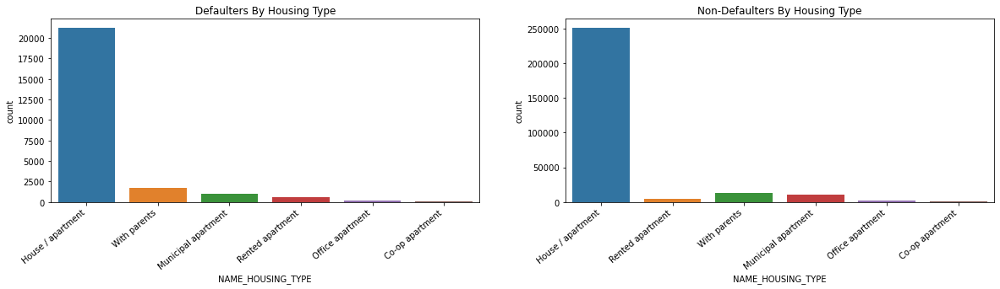

In [63]:
# Uni-Categorical - 4
# Influence of Housing Type on the repayment

plt.figure(figsize = (20, 4))
plt.subplot(1,2,1)
plt.title("Defaulters By Housing Type")
ax = sns.countplot(df1['NAME_HOUSING_TYPE'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.subplot(1,2,2)
plt.title("Non-Defaulters By Housing Type")
ax = sns.countplot(df0['NAME_HOUSING_TYPE'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.show()

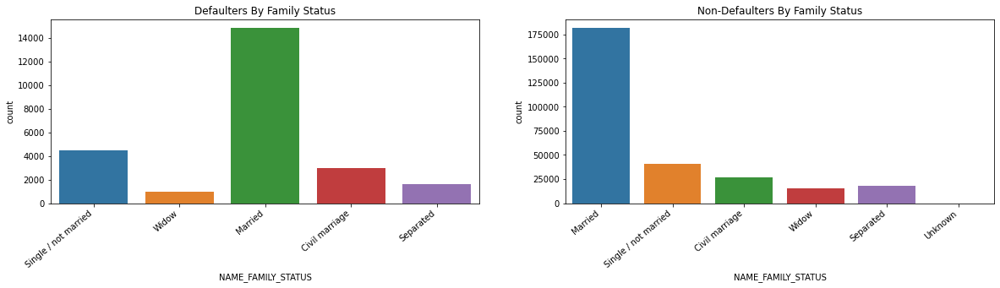

In [64]:
# Uni-Categorical - 5
# Influence of Housing Type on the repayment

plt.figure(figsize = (20, 4))
plt.subplot(1,2,1)
plt.title("Defaulters By Family Status")
ax = sns.countplot(df1['NAME_FAMILY_STATUS'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.subplot(1,2,2)
plt.title("Non-Defaulters By Family Status")
ax = sns.countplot(df0['NAME_FAMILY_STATUS'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.show()

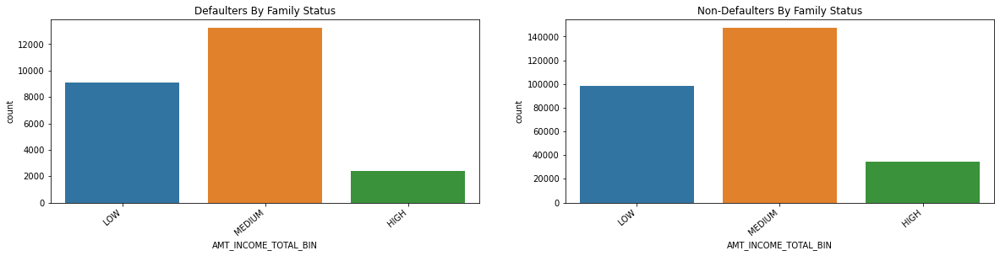

In [65]:
# Uni-Continuous - 1
# Influence of Income category on the repayment

plt.figure(figsize = (20, 4))
plt.subplot(1,2,1)
plt.title("Defaulters By Family Status")
ax = sns.countplot(df1['AMT_INCOME_TOTAL_BIN'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.subplot(1,2,2)
plt.title("Non-Defaulters By Family Status")
ax = sns.countplot(df0['AMT_INCOME_TOTAL_BIN'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.show()

In [66]:
application['AMT_INCOME_TOTAL_BIN'].value_counts()

MEDIUM    160334
LOW       107399
HIGH       37076
Name: AMT_INCOME_TOTAL_BIN, dtype: int64

In [67]:
df1['AMT_INCOME_TOTAL_BIN'].value_counts()

MEDIUM    13213
LOW        9066
HIGH       2400
Name: AMT_INCOME_TOTAL_BIN, dtype: int64

In [68]:
df0['AMT_INCOME_TOTAL_BIN'].value_counts()

MEDIUM    147121
LOW        98333
HIGH       34676
Name: AMT_INCOME_TOTAL_BIN, dtype: int64

Family status in medium catgory have opted for highest number loans

The default and no defaut percentages are almost similaer to the three groups

Hence all family status could be cosidered same while giving loans


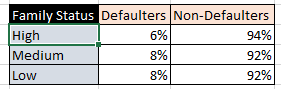

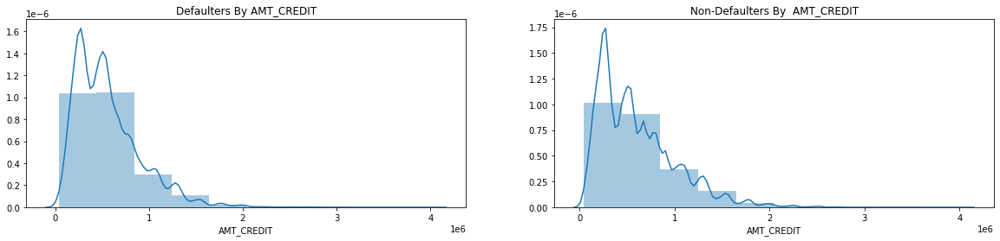

In [69]:
# Uni-Continuous - 2
# Influence of AMT_CREDIT on the repayment

plt.figure(figsize = (20, 4))
plt.subplot(1,2,1)
plt.title("Defaulters By AMT_CREDIT")
sns.distplot(df1['AMT_CREDIT'], kde=True, bins=10)

plt.subplot(1,2,2)
plt.title("Non-Defaulters By  AMT_CREDIT")
sns.distplot(df0['AMT_CREDIT'], kde=True, bins=10)

plt.show()

target0 and target1 are showing Similar Pattern for AMT_CREDIT Variable in the in terms of the PDF shown in the plot

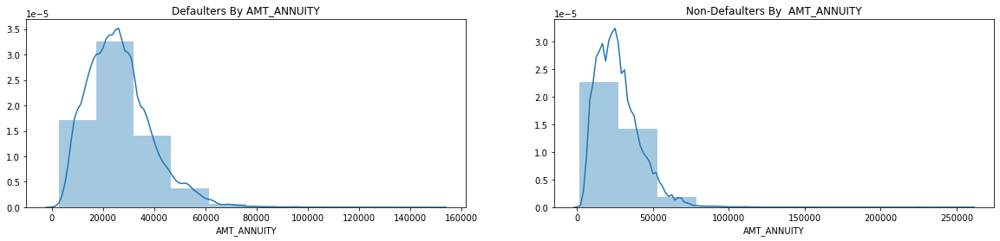

In [70]:
# Uni-Continuous - 3
# Influence of AMT_ANNUITY on the repayment

plt.figure(figsize = (20, 4))
plt.subplot(1,2,1)
plt.title("Defaulters By AMT_ANNUITY")
sns.distplot(df1['AMT_ANNUITY'], kde=True, bins=10)

plt.subplot(1,2,2)
plt.title("Non-Defaulters By  AMT_ANNUITY")
sns.distplot(df0['AMT_ANNUITY'], kde=True, bins=10)

plt.show()

Beside the Data imbalance target1 shows the better PDF than targeto for AMT_ANNUITY variable

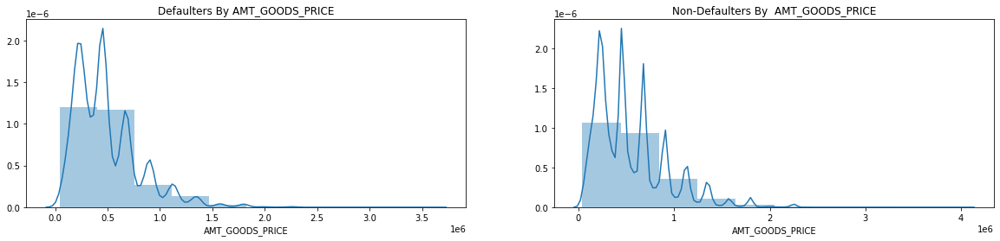

In [71]:
# Uni-Continuous - 4
# Influence of AMT_GOODS_PRICE on the repayment

plt.figure(figsize = (20, 4))
plt.subplot(1,2,1)
plt.title("Defaulters By AMT_GOODS_PRICE")
sns.distplot(df1['AMT_GOODS_PRICE'], kde=True, bins=10)

plt.subplot(1,2,2)
plt.title("Non-Defaulters By  AMT_GOODS_PRICE")
sns.distplot(df0['AMT_GOODS_PRICE'], kde=True, bins=10)

plt.show()

Beside the Data imbalance target0 and target1 showing the similar decraesing pattern in terms of PDF draw in the AMT_GOODS_PRICE variable

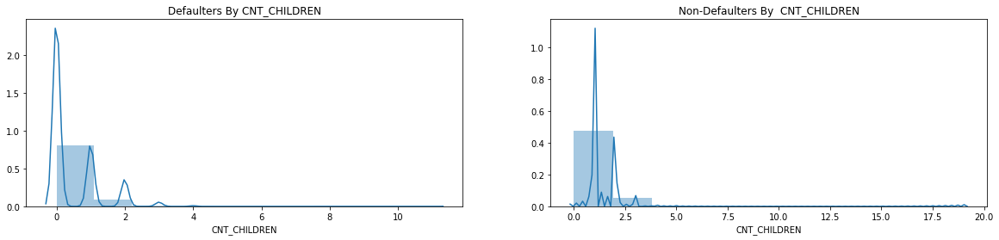

In [72]:
# Uni-Continuous - 5
# Influence of CNT_CHILDREN on the repayment

plt.figure(figsize = (20, 4))
plt.subplot(1,2,1)
plt.title("Defaulters By CNT_CHILDREN")
sns.distplot(df1['CNT_CHILDREN'], kde=True, bins=10)

plt.subplot(1,2,2)
plt.title("Non-Defaulters By  CNT_CHILDREN")
sns.distplot(df0['CNT_CHILDREN'], kde=True, bins=10)

plt.show()

Beside the Data imbalance target0 and target1 showing the similar decraesing pattern in terms of PDF draw in the CNT_CHILDREN variable

#### BiVariate Analysis

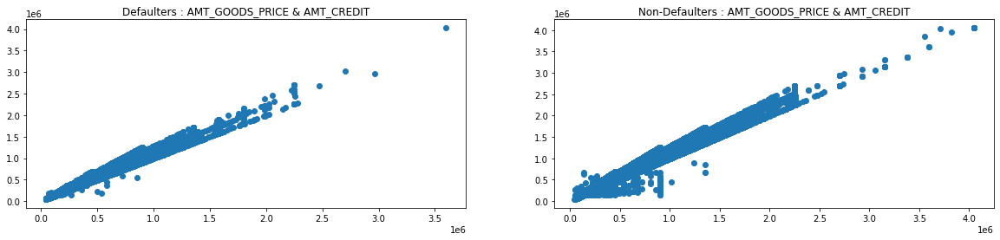

In [73]:
# AMT_GOODS_PRICE & AMT_CREDIT

plt.figure(figsize = (20, 4))
plt.subplot(1,2,1)
plt.title("Defaulters : AMT_GOODS_PRICE & AMT_CREDIT")
plt.scatter(df1['AMT_GOODS_PRICE'], df1['AMT_CREDIT'])

plt.subplot(1,2,2)
plt.title("Non-Defaulters : AMT_GOODS_PRICE & AMT_CREDIT")
plt.scatter(df0['AMT_GOODS_PRICE'], df0['AMT_CREDIT'])

plt.show()

In [ ]:
# Chaning back the CNT_FAM_MEMBERS to its original dattype to analyse

df0['CNT_FAM_MEMBERS'] = df0['CNT_FAM_MEMBERS'].astype('float')
df1['CNT_FAM_MEMBERS'] = df1['CNT_FAM_MEMBERS'].astype('float')

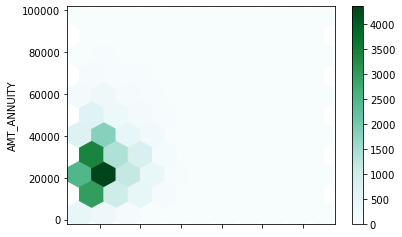

In [80]:
# AMT_ANNUITY & CNT_FAM_MEMBERS

#Defaulters : CNT_FAM_MEMBERS & AMT_ANNUITY

df1[df1['AMT_ANNUITY']< 100000 ].plot.hexbin(x='CNT_FAM_MEMBERS', y='AMT_ANNUITY', gridsize=10)


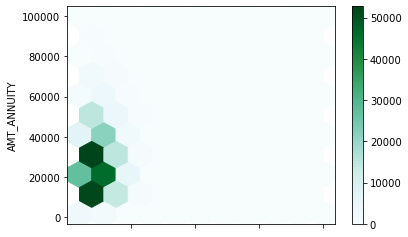

In [81]:
# AMT_ANNUITY & CNT_FAM_MEMBERS

#Non - Defaulters : CNT_FAM_MEMBERS & AMT_ANNUITY

df0[df0['AMT_ANNUITY']< 100000 ].plot.hexbin(x='CNT_FAM_MEMBERS', y='AMT_ANNUITY', gridsize=10)
plt.show()

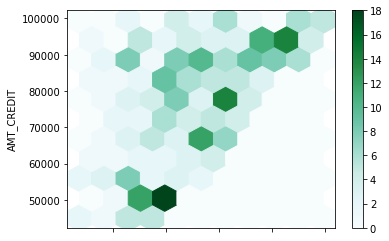

In [82]:
# Defaulters : AMT_CREDIT & AMT_ANNUITY

df1[df1['AMT_CREDIT']< 100000 ].plot.hexbin(y='AMT_CREDIT', x='AMT_ANNUITY', gridsize=10)
plt.show()

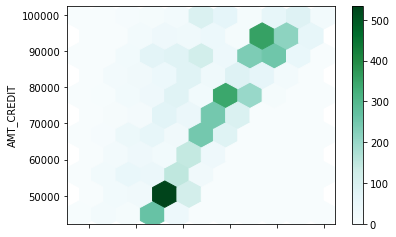

In [83]:
# Defaulters : AMT_CREDIT & AMT_ANNUITY

df0[df0['AMT_CREDIT']< 100000 ].plot.hexbin(y='AMT_CREDIT', x='AMT_ANNUITY', gridsize=10)
plt.show()

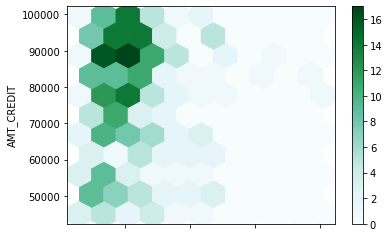

In [84]:
# Defaulters : AMT_CREDIT & AMT_INCOME_TOTAL

df1[df1['AMT_CREDIT']< 100000 ].plot.hexbin(y='AMT_CREDIT', x='AMT_INCOME_TOTAL', gridsize=10)
plt.show()

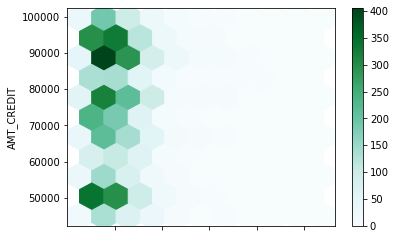

In [85]:
# Non Defaulters : AMT_CREDIT & AMT_INCOME_TOTAL

df0[df0['AMT_CREDIT']< 100000 ].plot.hexbin(y='AMT_CREDIT', x='AMT_INCOME_TOTAL', gridsize=10)
plt.show()

A Hexbin plot is useful to represent the relationship of 2 numerical variables when you have a lot of data point. Instead of overlapping, the plotting window is split in several hexbins, and the number of points per hexbin is counted. The color denotes this number of points.

As the Variables are having very much high and the are mostly overlapping so the hexplot is explaining very well for both target0 and target1.

AMT_ANNUITY & CNT_FAM_MEMBERS AND AMT_ANNUITY & OWN_CAR_AGE are the two variables showing

similar pattern of plots for the points in the hex bins and are same for target0 and target1 besides the highly data imbalanced.

AMT_CREDIT & AMT_ANNUITY is showing most correlated value in the range of 90000 to 100000 at points ranging from 15 to 17.5

AMT_CREDIT & HOUR_APPR_PROCESS_START is shoing most correlated value in the range of 90000 to 100000 at points ranging from 12 to 14 , after that in range 8 to 12 3 most correlated Credit value are available on the basis of HOUR_APPR_PROCESS_START

If the price is higher the default rate is high

#### Creation of corelation chart

In [96]:
# Creating corelation chart
newdf1 = df1
num = ['float64']
newdf1 = df1.select_dtypes(include = num)
newdf1.head()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,CNT_FAM_MEMBERS,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,202500.000000,406597.500000,24700.500000,351000.000000,0.018801,-3648.000000,1.000000,0.262949,0.139376,0.972200,0.083300,0.972200,0.083300,0.972200,0.083300,0.014900,2.000000,2.000000,2.000000,2.000000,-1134.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
26,112500.000000,979992.000000,27076.500000,702000.000000,0.018029,-6573.000000,1.000000,0.548477,0.190706,0.973200,0.041700,0.973200,0.041700,0.973200,0.041700,0.008500,10.000000,1.000000,10.000000,0.000000,-161.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000
40,202500.000000,1193580.000000,35028.000000,855000.000000,0.025164,-1182.000000,2.000000,0.306841,0.320163,0.996000,0.250000,0.996000,0.250000,0.996000,0.250000,0.146300,0.000000,0.000000,0.000000,0.000000,-1075.000000,0.000000,0.000000,0.000000,2.000000,0.000000,4.000000
42,135000.000000,288873.000000,16258.500000,238500.000000,0.007305,-45.000000,2.000000,0.674203,0.399676,nan,nan,nan,nan,nan,nan,nan,1.000000,0.000000,1.000000,0.000000,-1480.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
81,81000.000000,252000.000000,14593.500000,252000.000000,0.028663,-5391.000000,2.000000,0.023952,0.720944,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [97]:
# Dropping the columns 
newdf1.drop('AMT_REQ_CREDIT_BUREAU_MON', axis = 1, inplace = True)
newdf1.drop('AMT_REQ_CREDIT_BUREAU_QRT', axis = 1, inplace = True)
newdf1.drop('AMT_REQ_CREDIT_BUREAU_YEAR', axis = 1, inplace = True)
newdf1.drop('EXT_SOURCE_3', axis = 1, inplace = True)
newdf1.drop('DAYS_LAST_PHONE_CHANGE', axis = 1, inplace = True)

#sns.heatmap(corr_mat, annot =True)
newdf1.head()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,CNT_FAM_MEMBERS,EXT_SOURCE_2,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK
0,202500.000000,406597.500000,24700.500000,351000.000000,0.018801,-3648.000000,1.000000,0.262949,0.972200,0.083300,0.972200,0.083300,0.972200,0.083300,0.014900,2.000000,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000
26,112500.000000,979992.000000,27076.500000,702000.000000,0.018029,-6573.000000,1.000000,0.548477,0.973200,0.041700,0.973200,0.041700,0.973200,0.041700,0.008500,10.000000,1.000000,10.000000,0.000000,0.000000,0.000000,0.000000
40,202500.000000,1193580.000000,35028.000000,855000.000000,0.025164,-1182.000000,2.000000,0.306841,0.996000,0.250000,0.996000,0.250000,0.996000,0.250000,0.146300,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
42,135000.000000,288873.000000,16258.500000,238500.000000,0.007305,-45.000000,2.000000,0.674203,nan,nan,nan,nan,nan,nan,nan,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
81,81000.000000,252000.000000,14593.500000,252000.000000,0.028663,-5391.000000,2.000000,0.023952,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000


In [88]:
newdf1.drop('EXT_SOURCE_2', axis = 1, inplace = True)

In [89]:
newdf1.drop('AMT_REQ_CREDIT_BUREAU_HOUR', axis = 1, inplace = True)

In [90]:
newdf1.drop('AMT_REQ_CREDIT_BUREAU_DAY', axis = 1, inplace = True)

In [91]:
newdf1.drop('AMT_REQ_CREDIT_BUREAU_WEEK', axis = 1, inplace = True)

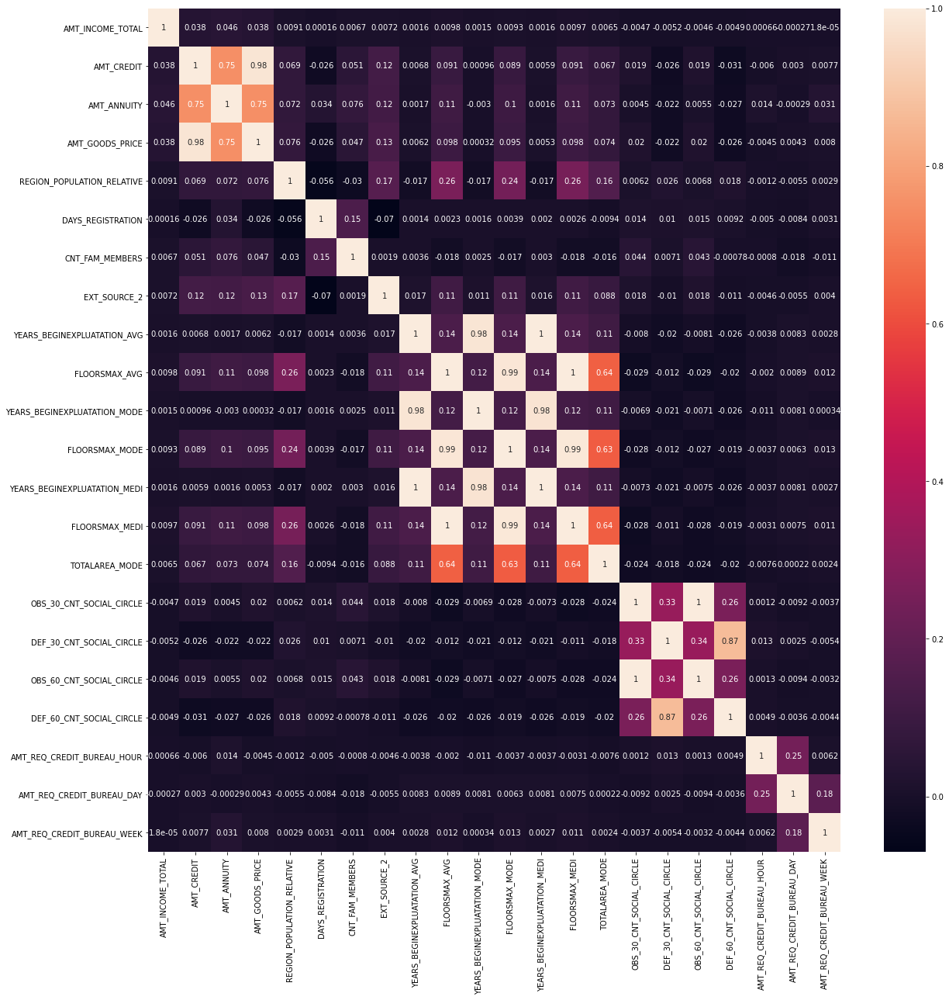

In [98]:
# Correlation : Defaulters
# Heatmap
plt.figure(figsize = (20, 20))
corr_mat = newdf1.corr()
sns.heatmap(corr_mat, annot =True)
plt.show()

In [99]:
# Get a list of highly correlated variable
corr_mat = newdf1.corr()
corr = corr_mat.where(np.triu(np.ones(corr_mat.shape), k=1).astype(np.bool))
corr = corr.abs().unstack().reset_index()
corr.columns = ['VAR1', 'VAR2', 'CORR']
corr.dropna(subset = ['CORR'], inplace = True)
corr.sort_values('CORR', ascending = False)

,VAR1,VAR2,CORR
389,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,0.998269
295,FLOORSMAX_MEDI,FLOORSMAX_AVG,0.997187
272,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_AVG,0.996124
297,FLOORSMAX_MEDI,FLOORSMAX_MODE,0.989195
251,FLOORSMAX_MODE,FLOORSMAX_AVG,0.986594
67,AMT_GOODS_PRICE,AMT_CREDIT,0.983103
228,YEARS_BEGINEXPLUATATION_MODE,YEARS_BEGINEXPLUATATION_AVG,0.980466
274,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_MODE,0.978073
412,DEF_60_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,0.868994
68,AMT_GOODS_PRICE,AMT_ANNUITY,0.752699


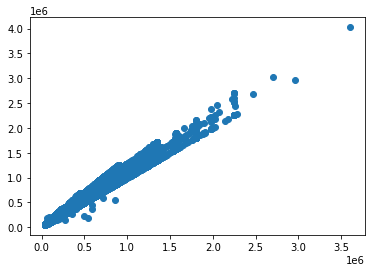

In [223]:
## ScatterPlot
plt.scatter(newdf1['AMT_GOODS_PRICE'], newdf1['AMT_CREDIT'])

In [100]:
# Correlation for non defaulters

df = application
zero = df["TARGET"] == 0
df2 = df[zero]
df2.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_INCOME_TOTAL_BIN,DAYS_BIRTH_BIN
1,100003,0,Cash loans,F,N,N,0,270000.000000,1293502.500000,35698.500000,1129500.000000,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.000000,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,nan,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,No,1.000000,0.000000,1.000000,0.000000,-828.000000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,HIGH,MIDDLE
2,100004,0,Revolving loans,M,Y,Y,0,67500.000000,135000.000000,6750.000000,135000.000000,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.000000,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,nan,nan,nan,nan,nan,nan,nan,NaN,0.000000,0.000000,0.000000,0.000000,-815.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,LOW,MIDDLE
3,100006,0,Cash loans,F,N,Y,0,135000.000000,312682.500000,29686.500000,297000.000000,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.000000,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,nan,nan,nan,nan,nan,nan,nan,nan,NaN,2.000000,0.000000,2.000000,0.000000,-617.000000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,nan,nan,nan,nan,nan,nan,MEDIUM,MIDDLE
4,100007,0,Cash loans,M,N,Y,0,121500.000000,513000.000000,21865.500000,513000.000000,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.000000,-3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,nan,nan,nan,nan,nan,nan,nan,nan,NaN,0.000000,0.000000,0.000000,0.000000,-1106.000000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,LOW,MIDDLE
5,100008,0,Cash loans,M,N,Y,0,99000.000000,490495.500000,27517.500000,454500.000000,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,-16941,-1588,-4970.000000,-477,1,1,1,1,1,0,Laborers,2.0,2,2,WEDNESDAY,16,0,0,0,0,0,0,Other,0.354225,0.621226,nan,nan,nan,nan,nan,nan,nan,NaN,0.000000,0.000000,0.000000,0.000000,-2536.000000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,LOW,MIDDLE


In [101]:
# Creating corelation chart
newdf2 = df2
num = ['float64']
newdf2 = df2.select_dtypes(include = num)
newdf2.head()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
1,270000.000000,1293502.500000,35698.500000,1129500.000000,0.003541,-1186.000000,0.622246,nan,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,1.000000,0.000000,1.000000,0.000000,-828.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,67500.000000,135000.000000,6750.000000,135000.000000,0.010032,-4260.000000,0.555912,0.729567,nan,nan,nan,nan,nan,nan,nan,0.000000,0.000000,0.000000,0.000000,-815.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,135000.000000,312682.500000,29686.500000,297000.000000,0.008019,-9833.000000,0.650442,nan,nan,nan,nan,nan,nan,nan,nan,2.000000,0.000000,2.000000,0.000000,-617.000000,nan,nan,nan,nan,nan,nan
4,121500.000000,513000.000000,21865.500000,513000.000000,0.028663,-4311.000000,0.322738,nan,nan,nan,nan,nan,nan,nan,nan,0.000000,0.000000,0.000000,0.000000,-1106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,99000.000000,490495.500000,27517.500000,454500.000000,0.035792,-4970.000000,0.354225,0.621226,nan,nan,nan,nan,nan,nan,nan,0.000000,0.000000,0.000000,0.000000,-2536.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000


In [102]:
# Dropping the columns 
newdf2.drop('AMT_REQ_CREDIT_BUREAU_MON', axis = 1, inplace = True)
newdf2.drop('AMT_REQ_CREDIT_BUREAU_QRT', axis = 1, inplace = True)
newdf2.drop('AMT_REQ_CREDIT_BUREAU_YEAR', axis = 1, inplace = True)
newdf2.drop('EXT_SOURCE_3', axis = 1, inplace = True)
newdf2.drop('DAYS_LAST_PHONE_CHANGE', axis = 1, inplace = True)
newdf2.drop('EXT_SOURCE_2', axis = 1, inplace = True)
newdf2.drop('AMT_REQ_CREDIT_BUREAU_HOUR', axis = 1, inplace = True)
newdf2.drop('AMT_REQ_CREDIT_BUREAU_DAY', axis = 1, inplace = True)
newdf2.drop('AMT_REQ_CREDIT_BUREAU_WEEK', axis = 1, inplace = True)
#sns.heatmap(corr_mat, annot =True)
newdf2.head()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE
1,270000.000000,1293502.500000,35698.500000,1129500.000000,0.003541,-1186.000000,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,1.000000,0.000000,1.000000,0.000000
2,67500.000000,135000.000000,6750.000000,135000.000000,0.010032,-4260.000000,nan,nan,nan,nan,nan,nan,nan,0.000000,0.000000,0.000000,0.000000
3,135000.000000,312682.500000,29686.500000,297000.000000,0.008019,-9833.000000,nan,nan,nan,nan,nan,nan,nan,2.000000,0.000000,2.000000,0.000000
4,121500.000000,513000.000000,21865.500000,513000.000000,0.028663,-4311.000000,nan,nan,nan,nan,nan,nan,nan,0.000000,0.000000,0.000000,0.000000
5,99000.000000,490495.500000,27517.500000,454500.000000,0.035792,-4970.000000,nan,nan,nan,nan,nan,nan,nan,0.000000,0.000000,0.000000,0.000000


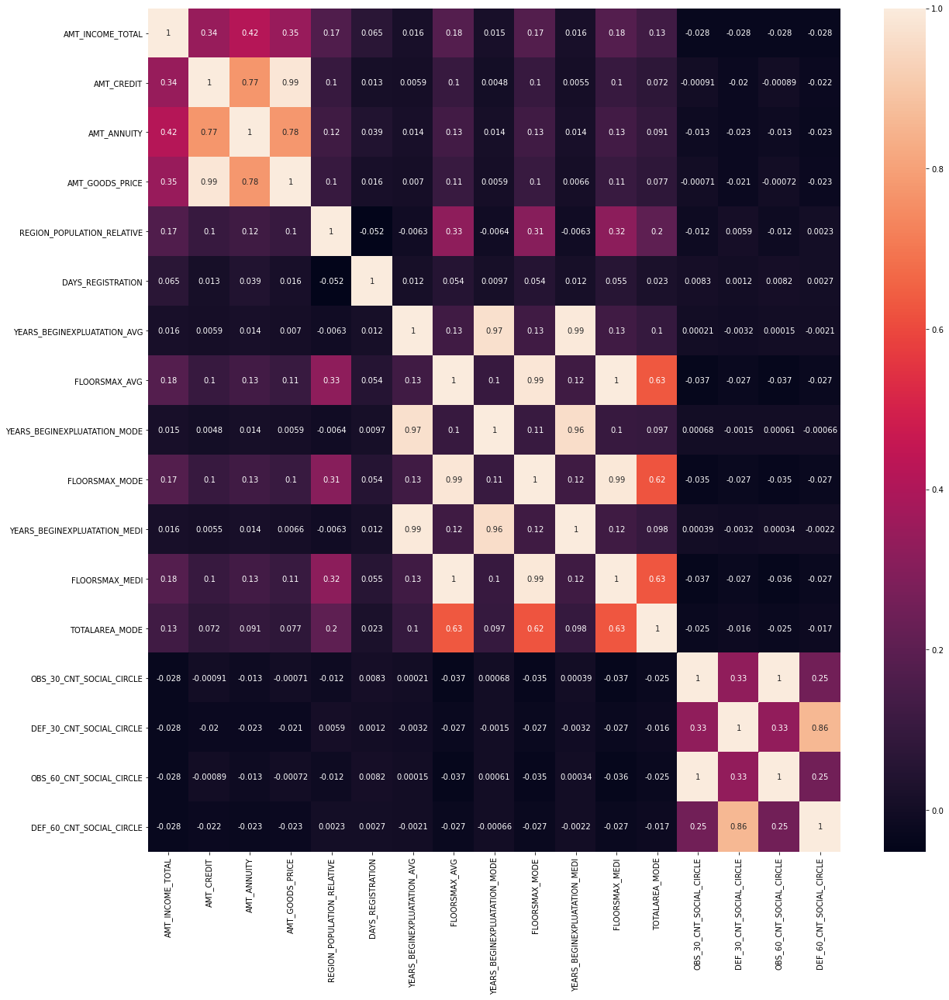

In [103]:
# Correlation : NonDefaulters
plt.figure(figsize = (20, 20))
corr_mat = newdf2.corr()
sns.heatmap(corr_mat, annot =True)
plt.show()

In [104]:
# Get a list of highly correlated variable
corr_mat = newdf2.corr()
corr = corr_mat.where(np.triu(np.ones(corr_mat.shape), k=1).astype(np.bool))
corr = corr.abs().unstack().reset_index()
corr.columns = ['VAR1', 'VAR2', 'CORR']
corr.dropna(subset = ['CORR'], inplace = True)
corr.sort_values('CORR', ascending = False)

,VAR1,VAR2,CORR
268,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,0.998508
194,FLOORSMAX_MEDI,FLOORSMAX_AVG,0.997018
176,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_AVG,0.993582
196,FLOORSMAX_MEDI,FLOORSMAX_MODE,0.988153
52,AMT_GOODS_PRICE,AMT_CREDIT,0.987250
160,FLOORSMAX_MODE,FLOORSMAX_AVG,0.985603
142,YEARS_BEGINEXPLUATATION_MODE,YEARS_BEGINEXPLUATATION_AVG,0.971032
178,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_MODE,0.962064
286,DEF_60_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,0.859332
53,AMT_GOODS_PRICE,AMT_ANNUITY,0.776686


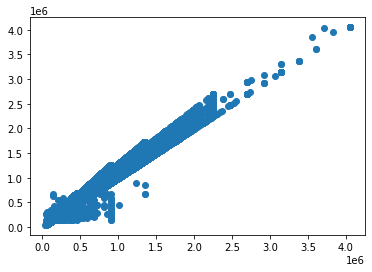

In [105]:
## ScatterPlot
plt.scatter(newdf2['AMT_GOODS_PRICE'], newdf2['AMT_CREDIT'])
plt.show()

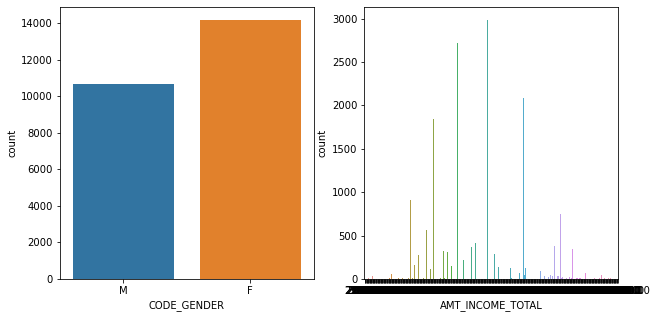

In [106]:
# Bar Plot for Target = "1", likely default customers
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
sns.countplot(x = 'CODE_GENDER', data  =df1)
plt.subplot(1,2,2)
sns.countplot(x = 'AMT_INCOME_TOTAL', data = df1)
plt.show()

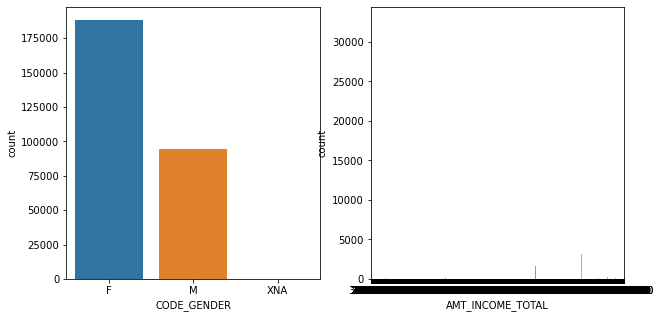

In [107]:
# Bar Plot for Target = "0", un-likely default customers
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
sns.countplot(x = 'CODE_GENDER', data  =df2)
plt.subplot(1,2,2)
sns.countplot(x = 'AMT_INCOME_TOTAL', data = df2)
plt.show()

Female customer are more and having better payment histroy than the male customers

More number of children, there are more chances of default

In [115]:
non_default=df0
default=df1

Younger customers are more likely to default, compared to Middle aged and Old people

In [116]:
#Correlation calculation for continuous variables
continuous_list=['CNT_CHILDREN','CNT_FAM_MEMBERS','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','DAYS_BIRTH','DAYS_EMPLOYED']
default_cont=default[continuous_list]
default_cont.corr()

,CNT_CHILDREN,CNT_FAM_MEMBERS,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,DAYS_BIRTH,DAYS_EMPLOYED
CNT_CHILDREN,1.000000,0.885484,0.004796,-0.001675,0.031257,0.259109,-0.191942
CNT_FAM_MEMBERS,0.885484,1.000000,0.006654,0.051224,0.075711,0.203267,-0.186561
AMT_INCOME_TOTAL,0.004796,0.006654,1.000000,0.038131,0.046421,0.003096,-0.014979
AMT_CREDIT,-0.001675,0.051224,0.038131,1.000000,0.752195,-0.135316,-0.000968
AMT_ANNUITY,0.031257,0.075711,0.046421,0.752195,1.000000,-0.014303,-0.082552
DAYS_BIRTH,0.259109,0.203267,0.003096,-0.135316,-0.014303,1.000000,-0.575097
DAYS_EMPLOYED,-0.191942,-0.186561,-0.014979,-0.000968,-0.082552,-0.575097,1.000000


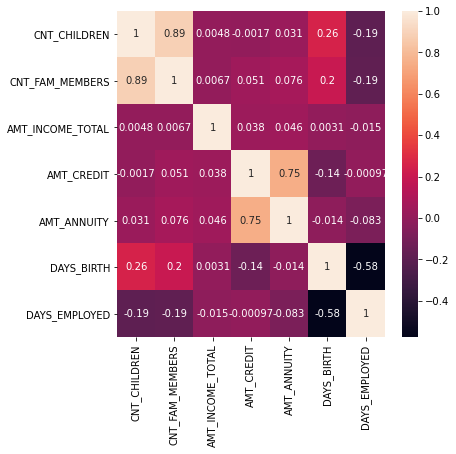

In [117]:
# TWO Continuous:
# Heatmap - Defaulters
plt.figure(figsize = (6,6))
continuous_list=['CNT_CHILDREN','CNT_FAM_MEMBERS','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','DAYS_BIRTH','DAYS_EMPLOYED']
default_cont=default[continuous_list]
corr_mat = default_cont.corr()
sns.heatmap(corr_mat, annot =True)
plt.show()

The above correlation matrix shows that the continuos variables like number of children, number of family members, lesser days of birth or age, number of days employed is having negative correlation of repayment history. If these variables increases the repayment decreases (i.e., default chances are more)

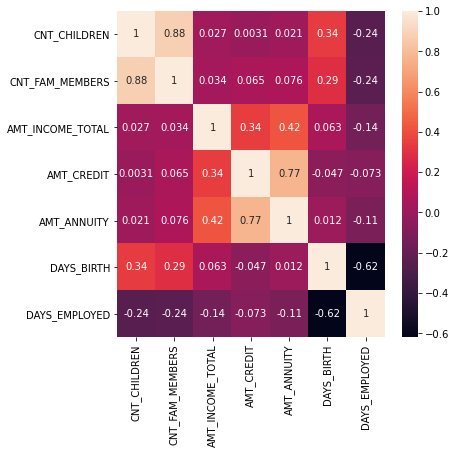

In [123]:
# TWO Continuous:
# Heatmap - Non Deafulaters
plt.figure(figsize = (6,6))
continuous_list=['CNT_CHILDREN','CNT_FAM_MEMBERS','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','DAYS_BIRTH','DAYS_EMPLOYED']
default_cont=non_default[continuous_list]
corr_mat = default_cont.corr()
sns.heatmap(corr_mat, annot =True)
plt.show()

## Previous Application

In [118]:
# Check the number of rows and columns of previous application dataset
previous_application.shape

(1670214, 37)

In [119]:
#Get the basic info of the previous application dataset
previous_application.info(verbose = True, null_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [120]:
# Check for the number of columsn having missing values
missing_prev_application = previous_application.isnull().sum()
print(len(missing_prev_application))
missing_prev_application_50 = missing_prev_application[missing_prev_application.values>=(0.5*len(missing_prev_application))]
print(len(missing_prev_application_50))

37
15


In [121]:
# Sneak peak of the statistics of the data
previous_application.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1670214.000000,1670214.000000,1297979.000000,1670214.000000,1670213.000000,774370.000000,1284699.000000,1670214.000000,1670214.000000,774370.000000,5951.000000,5951.000000,1670214.000000,1670214.000000,1297984.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1923089.135331,278357.174099,15955.120659,175233.860360,196114.021218,6697.402139,227847.279283,12.484182,0.996468,0.079637,0.188357,0.773503,-880.679668,313.951115,16.054082,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,532597.958696,102814.823849,14782.137335,292779.762387,318574.616546,20921.495410,315396.557937,3.334028,0.059330,0.107823,0.087671,0.100879,779.099667,7127.443459,14.567288,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1000001.000000,100001.000000,0.000000,0.000000,0.000000,-0.900000,0.000000,0.000000,0.000000,-0.000015,0.034781,0.373150,-2922.000000,-1.000000,0.000000,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1461857.250000,189329.000000,6321.780000,18720.000000,24160.500000,0.000000,50841.000000,10.000000,1.000000,0.000000,0.160716,0.715645,-1300.000000,-1.000000,6.000000,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1923110.500000,278714.500000,11250.000000,71046.000000,80541.000000,1638.000000,112320.000000,12.000000,1.000000,0.051605,0.189122,0.835095,-581.000000,3.000000,12.000000,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2384279.750000,367514.000000,20658.420000,180360.000000,216418.500000,7740.000000,234000.000000,15.000000,1.000000,0.108909,0.193330,0.852537,-280.000000,82.000000,24.000000,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2845382.000000,456255.000000,418058.145000,6905160.000000,6905160.000000,3060045.000000,6905160.000000,23.000000,1.000000,1.000000,1.000000,1.000000,-1.000000,4000000.000000,84.000000,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [122]:
# Check the data structure 
previous_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430000,17145.000000,17145.000000,0.000000,17145.000000,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.000000,middle,POS mobile with interest,365243.000000,-42.000000,300.000000,-42.000000,-37.000000,0.000000
1,2802425,108129,Cash loans,25188.615000,607500.000000,679671.000000,nan,607500.000000,THURSDAY,11,Y,1,nan,nan,nan,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.000000,low_action,Cash X-Sell: low,365243.000000,-134.000000,916.000000,365243.000000,365243.000000,1.000000
2,2523466,122040,Cash loans,15060.735000,112500.000000,136444.500000,nan,112500.000000,TUESDAY,11,Y,1,nan,nan,nan,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.000000,high,Cash X-Sell: high,365243.000000,-271.000000,59.000000,365243.000000,365243.000000,1.000000
3,2819243,176158,Cash loans,47041.335000,450000.000000,470790.000000,nan,450000.000000,MONDAY,7,Y,1,nan,nan,nan,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.000000,middle,Cash X-Sell: middle,365243.000000,-482.000000,-152.000000,-182.000000,-177.000000,1.000000
4,1784265,202054,Cash loans,31924.395000,337500.000000,404055.000000,nan,337500.000000,THURSDAY,9,Y,1,nan,nan,nan,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.000000,high,Cash Street: high,nan,nan,nan,nan,nan,nan


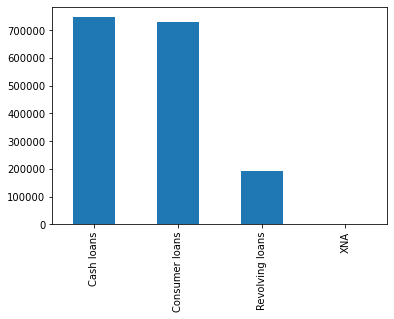

In [124]:
# NAME_CONTRACT_TYPE
previous_application['NAME_CONTRACT_TYPE'].value_counts().head(10).plot.bar()
plt.show()

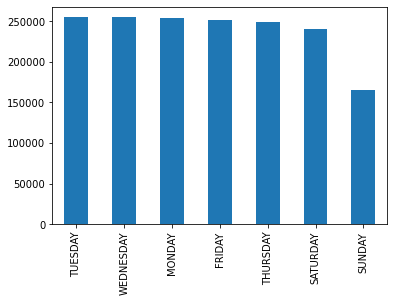

In [125]:
# WEEKDAY_APPR_PROCESS_START
previous_application['WEEKDAY_APPR_PROCESS_START'].value_counts().head(10).plot.bar()
plt.show()

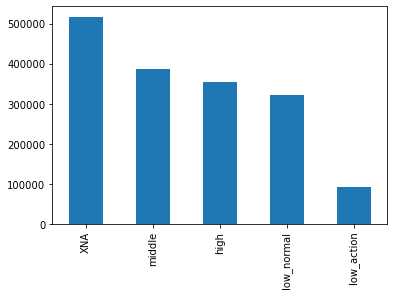

In [126]:
# NAME_YIELD_GROUP
previous_application['NAME_YIELD_GROUP'].value_counts().head(10).plot.bar()
plt.show()

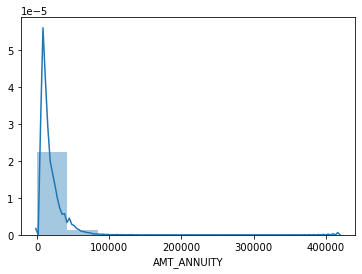

In [128]:
# AMT_ANNUITY 
sns.distplot(previous_application['AMT_ANNUITY'], kde=True, bins=10)
plt.show()

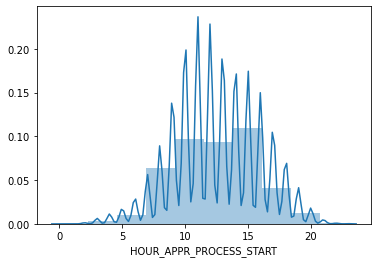

In [132]:
# AMT_APPLICATION 
sns.distplot(previous_application['HOUR_APPR_PROCESS_START'], kde=True, bins=10)
plt.show()

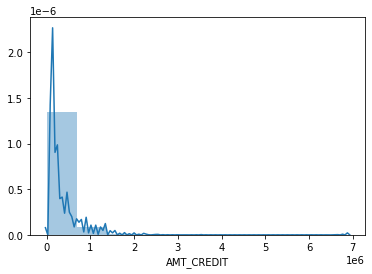

In [130]:
# AMT_CREDIT HOUR_APPR_PROCESS_START 
sns.distplot(previous_application['AMT_CREDIT'], kde=True, bins=10)
plt.show()

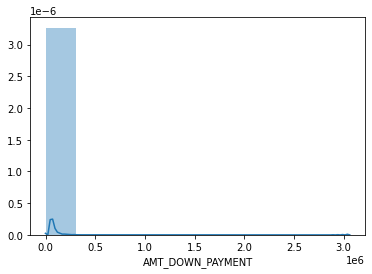

In [131]:
# AMT_DOWN_PAYMENT
sns.distplot(previous_application['AMT_DOWN_PAYMENT'], kde=True, bins=10)
plt.show()


#### Bivariate Analysis Of Previous_Application_Data

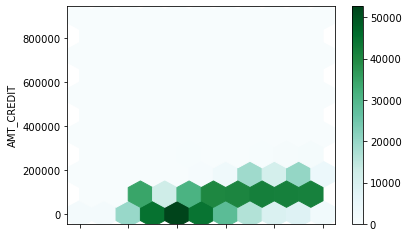

In [133]:
# AMT_ANNUITY & AMT_CREDIT
previous_application[previous_application['AMT_ANNUITY']< 10000 ].plot.hexbin(y='AMT_CREDIT', x='AMT_ANNUITY', gridsize=10)

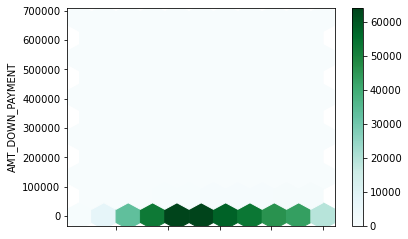

In [134]:
# AMT_ANNUITY & AMT_DOWN_PAYMENT
previous_application[previous_application['AMT_ANNUITY']< 10000 ].plot.hexbin(y='AMT_DOWN_PAYMENT', x='AMT_ANNUITY', gridsize=10)

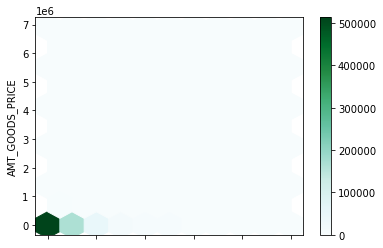

In [135]:
# AMT_GOODS_PRICE & AMT_DOWN_PAYMENT
previous_application[previous_application['AMT_DOWN_PAYMENT']< 100000 ].plot.hexbin(y='AMT_GOODS_PRICE', x='AMT_DOWN_PAYMENT', gridsize=10)


### Quality check : Handling of missing values

In [265]:
appl_data = application
prev_data = previous_application

In [266]:
#Creating a new dataframe with merging two dataframes with column id = SK_ID_CURR
result = pd.merge(appl_data,prev_data,on='SK_ID_CURR')
result.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_INCOME_TOTAL_BIN,DAYS_BIRTH_BIN,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_y,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.000000,406597.500000,24700.500000,351000.000000,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,-9461,-637,-3648.000000,-2120,1,1,0,1,1,0,Laborers,1.0,2,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,0.972200,0.083300,0.972200,0.083300,0.972200,0.083300,0.014900,No,-1134.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,MEDIUM,YOUNG,1038818,Consumer loans,9251.775000,179055.000000,179055.000000,0.000000,179055.000000,SATURDAY,9,Y,1,0.000000,nan,nan,XAP,Approved,-606,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.000000,low_normal,POS other with interest,365243.000000,-565.000000,125.000000,-25.000000,-17.000000,0.000000
1,100003,0,Cash loans,F,N,N,0,270000.000000,1293502.500000,35698.500000,1129500.000000,Family,State servant,Higher education,Married,House / apartment,-16765,-1188,-1186.000000,-291,1,1,0,1,1,0,Core staff,2.0,1,0,0,0,0,0,0,School,0.622246,nan,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,No,-828.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,HIGH,MIDDLE,1810518,Cash loans,98356.995000,900000.000000,1035882.000000,nan,900000.000000,FRIDAY,12,Y,1,nan,nan,nan,XNA,Approved,-746,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.000000,low_normal,Cash X-Sell: low,365243.000000,-716.000000,-386.000000,-536.000000,-527.000000,1.000000
2,100003,0,Cash loans,F,N,N,0,270000.000000,1293502.500000,35698.500000,1129500.000000,Family,State servant,Higher education,Married,House / apartment,-16765,-1188,-1186.000000,-291,1,1,0,1,1,0,Core staff,2.0,1,0,0,0,0,0,0,School,0.622246,nan,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,No,-828.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,HIGH,MIDDLE,2636178,Consumer loans,64567.665000,337500.000000,348637.500000,0.000000,337500.000000,SUNDAY,17,Y,1,0.000000,nan,nan,XAP,Approved,-828,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.000000,middle,POS industry with interest,365243.000000,-797.000000,-647.000000,-647.000000,-639.000000,0.000000
3,100003,0,Cash loans,F,N,N,0,270000.000000,1293502.500000,35698.500000,1129500.000000,Family,State servant,Higher education,Married,House /

### Analysisng the combined dataframe

In [267]:
#Dataframe with required columns
num = ['int64', 'float64']
new_res = result.select_dtypes(include = num)
new_res.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE_y,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,0,202500.000000,406597.500000,24700.500000,351000.000000,-9461,-637,-3648.000000,-2120,1,1,0,1,1,0,2,0,0,0,0,0,0,0.262949,0.139376,0.972200,0.083300,0.972200,0.083300,0.972200,0.083300,0.014900,-1134.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1038818,9251.775000,179055.000000,179055.000000,0.000000,179055.000000,9,1,0.000000,nan,nan,-606,500,24.000000,365243.000000,-565.000000,125.000000,-25.000000,-17.000000,0.000000
1,100003,0,0,270000.000000,1293502.500000,35698.500000,1129500.000000,-16765,-1188,-1186.000000,-291,1,1,0,1,1,0,1,0,0,0,0,0,0,0.622246,nan,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,-828.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1810518,98356.995000,900000.000000,1035882.000000,nan,900000.000000,12,1,nan,nan,nan,-746,-1,12.000000,365243.000000,-716.000000,-386.000000,-536.000000,-527.000000,1.000000
2,100003,0,0,270000.000000,1293502.500000,35698.500000,1129500.000000,-16765,-1188,-1186.000000,-291,1,1,0,1,1,0,1,0,0,0,0,0,0,0.622246,nan,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,-828.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2636178,64567.665000,337500.000000,348637.500000,0.000000,337500.000000,17,1,0.000000,nan,nan,-828,1400,6.000000,365243.000000,-797.000000,-647.000000,-647.000000,-639.000000,0.000000
3,100003,0,0,270000.000000,1293502.500000,35698.500000,1129500.000000,-16765,-1188,-1186.000000,-291,1,1,0,1,1,0,1,0,0,0,0,0,0,0.622246,nan,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,-828.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2396755,6737.310000,68809.500000,68053.500000,6885.000000,68809.500000,15,1,0.100061,nan,nan,-2341,200,12.000000,365243.000000,-2310.000000,-1980.000000,-1980.000000,-1976.000000,1.000000
4,100004,0,0,67500.000000,135000.000000,6750.000000,135000.000000,-19046,-225,-4260.000000,-2531,1,1,1,1,1,0,2,0,0,0,0,0,0,0.555912,0.729567,nan,nan,nan,nan,nan,nan,nan,-815.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1564014,5357.250000,24282.000000,20106.000000,4860.000000,24282.000000,5,1,0.212008,nan,nan,-815,30,4.000000,365243.000000,-784.000000,-694.000000,-724.000000,-714.000000,0.000000


In [268]:
#Dropping columns not required
new_res.drop('CNT_CHILDREN', axis = 1, inplace = True)
new_res.drop('DAYS_REGISTRATION', axis = 1, inplace = True)
new_res.drop('AMT_ANNUITY_y', axis = 1, inplace = True)
new_res.drop('HOUR_APPR_PROCESS_START', axis = 1, inplace = True)
new_res.drop('NFLAG_LAST_APPL_IN_DAY', axis = 1, inplace = True)
new_res.drop('DAYS_DECISION', axis = 1, inplace = True)
new_res.drop('SELLERPLACE_AREA', axis = 1, inplace = True)

In [269]:
new_res.head()

,SK_ID_CURR,TARGET,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,AMT_APPLICATION,AMT_CREDIT_y,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE_y,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,202500.000000,406597.500000,24700.500000,351000.000000,-9461,-637,-2120,1,1,0,1,1,0,2,0,0,0,0,0,0,0.262949,0.139376,0.972200,0.083300,0.972200,0.083300,0.972200,0.083300,0.014900,-1134.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1038818,179055.000000,179055.000000,0.000000,179055.000000,0.000000,nan,nan,24.000000,365243.000000,-565.000000,125.000000,-25.000000,-17.000000,0.000000
1,100003,0,270000.000000,1293502.500000,35698.500000,1129500.000000,-16765,-1188,-291,1,1,0,1,1,0,1,0,0,0,0,0,0,0.622246,nan,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,-828.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1810518,900000.000000,1035882.000000,nan,900000.000000,nan,nan,nan,12.000000,365243.000000,-716.000000,-386.000000,-536.000000,-527.000000,1.000000
2,100003,0,270000.000000,1293502.500000,35698.500000,1129500.000000,-16765,-1188,-291,1,1,0,1,1,0,1,0,0,0,0,0,0,0.622246,nan,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,-828.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2636178,337500.000000,348637.500000,0.000000,337500.000000,0.000000,nan,nan,6.000000,365243.000000,-797.000000,-647.000000,-647.000000,-639.000000,0.000000
3,100003,0,270000.000000,1293502.500000,35698.500000,1129500.000000,-16765,-1188,-291,1,1,0,1,1,0,1,0,0,0,0,0,0,0.622246,nan,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,-828.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2396755,68809.500000,68053.500000,6885.000000,68809.500000,0.100061,nan,nan,12.000000,365243.000000,-2310.000000,-1980.000000,-1980.000000,-1976.000000,1.000000
4,100004,0,67500.000000,135000.000000,6750.000000,135000.000000,-19046,-225,-2531,1,1,1,1,1,0,2,0,0,0,0,0,0,0.555912,0.729567,nan,nan,nan,nan,nan,nan,nan,-815.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1564014,24282.000000,20106.000000,4860.000000,24282.000000,0.212008,nan,nan,4.000000,365243.000000,-784.000000,-694.000000,-724.000000,-714.000000,0.000000


In [270]:
# dropping few more set of columns

new_res.drop('DAYS_ID_PUBLISH', axis = 1, inplace = True)
new_res.drop('EXT_SOURCE_3', axis = 1, inplace = True)
new_res.drop('DAYS_LAST_PHONE_CHANGE', axis = 1, inplace = True)
new_res.drop('AMT_REQ_CREDIT_BUREAU_MON', axis = 1, inplace = True)
new_res.drop('AMT_REQ_CREDIT_BUREAU_QRT', axis = 1, inplace = True)
new_res.drop('AMT_REQ_CREDIT_BUREAU_YEAR', axis = 1, inplace = True)
new_res.drop('AMT_GOODS_PRICE_y', axis = 1, inplace = True)
new_res.drop('CNT_PAYMENT', axis = 1, inplace = True)

In [273]:
#new_res.drop('CNT_FAM_MEMBERS', axis = 1, inplace = True)
new_res.drop('REGION_RATING_CLIENT_W_CITY', axis = 1, inplace = True)
new_res.drop('REG_REGION_NOT_LIVE_REGION', axis = 1, inplace = True)
new_res.drop('REG_REGION_NOT_WORK_REGION', axis = 1, inplace = True)
new_res.drop('LIVE_REGION_NOT_WORK_REGION', axis = 1, inplace = True)
new_res.drop('REG_CITY_NOT_LIVE_CITY', axis = 1, inplace = True)
new_res.drop('REG_CITY_NOT_WORK_CITY', axis = 1, inplace = True)
new_res.drop('LIVE_CITY_NOT_WORK_CITY', axis = 1, inplace = True)
new_res.drop('SK_ID_CURR', axis = 1, inplace = True)
new_res.drop('AMT_GOODS_PRICE_x', axis = 1, inplace = True)
new_res.drop('DAYS_BIRTH', axis = 1, inplace = True)
new_res.drop('AMT_APPLICATION', axis = 1, inplace = True)

In [274]:
new_res.head()

,TARGET,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,EXT_SOURCE_2,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,SK_ID_PREV,AMT_CREDIT_y,AMT_DOWN_PAYMENT,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,1,202500.000000,406597.500000,24700.500000,-637,1,1,0,1,1,0,0.262949,0.972200,0.083300,0.972200,0.083300,0.972200,0.083300,0.014900,0.000000,0.000000,0.000000,1038818,179055.000000,0.000000,0.000000,nan,nan,365243.000000,-565.000000,125.000000,-25.000000,-17.000000,0.000000
1,0,270000.000000,1293502.500000,35698.500000,-1188,1,1,0,1,1,0,0.622246,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,0.000000,0.000000,0.000000,1810518,1035882.000000,nan,nan,nan,nan,365243.000000,-716.000000,-386.000000,-536.000000,-527.000000,1.000000
2,0,270000.000000,1293502.500000,35698.500000,-1188,1,1,0,1,1,0,0.622246,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,0.000000,0.000000,0.000000,2636178,348637.500000,0.000000,0.000000,nan,nan,365243.000000,-797.000000,-647.000000,-647.000000,-639.000000,0.000000
3,0,270000.000000,1293502.500000,35698.500000,-1188,1,1,0,1,1,0,0.622246,0.985100,0.291700,0.985100,0.291700,0.985100,0.291700,0.071400,0.000000,0.000000,0.000000,2396755,68053.500000,6885.000000,0.100061,nan,nan,365243.000000,-2310.000000,-1980.000000,-1980.000000,-1976.000000,1.000000
4,0,67500.000000,135000.000000,6750.000000,-225,1,1,1,1,1,0,0.555912,nan,nan,nan,nan,nan,nan,nan,0.000000,0.000000,0.000000,1564014,20106.000000,4860.000000,0.212008,nan,nan,365243.000000,-784.000000,-694.000000,-724.000000,-714.000000,0.000000


In [275]:
new_res.drop('SK_ID_PREV', axis = 1, inplace = True)

In [283]:
new_res.drop('FLAG_MOBIL', axis = 1, inplace = True)

In [284]:
new_res.drop('FLAG_EMP_PHONE', axis = 1, inplace = True)

In [285]:
new_res.drop('FLAG_WORK_PHONE', axis = 1, inplace = True)

In [286]:
new_res.drop('FLAG_CONT_MOBILE', axis = 1, inplace = True)

In [287]:
new_res.drop('FLAG_PHONE', axis = 1, inplace = True)

In [288]:
new_res.drop('FLAG_EMAIL', axis = 1, inplace = True)

In [289]:
new_res.drop('EXT_SOURCE_2', axis = 1, inplace = True)

In [290]:
new_res.drop('YEARS_BEGINEXPLUATATION_AVG', axis = 1, inplace = True)

In [ ]:
new_res.drop('YEARS_BUILD_AVG', axis = 1, inplace = True)

In [296]:
new_res.drop('FLOORSMAX_AVG', axis = 1, inplace = True)

In [297]:
new_res.drop('YEARS_BEGINEXPLUATATION_MODE', axis = 1, inplace = True)

In [298]:
new_res.drop('TOTALAREA_MODE', axis = 1, inplace = True)

In [300]:
new_res.drop('FLOORSMAX_MEDI', axis = 1, inplace = True)

In [302]:
new_res.drop('AMT_REQ_CREDIT_BUREAU_HOUR', axis = 1, inplace = True)

In [303]:
new_res.drop('AMT_REQ_CREDIT_BUREAU_DAY', axis = 1, inplace = True)

In [304]:
new_res.drop('AMT_REQ_CREDIT_BUREAU_WEEK', axis = 1, inplace = True)

In [307]:
new_res.drop('FLOORSMAX_MODE', axis = 1, inplace = True)

In [ ]:
new_res.drop('AMT_REQ_CREDIT_BUREAU_WEEK', axis = 1, inplace = True)

In [308]:
new_res.drop('YEARS_BEGINEXPLUATATION_MEDI', axis = 1, inplace = True)

In [ ]:
new_res.drop('AMT_REQ_CREDIT_BUREAU_WEEK', axis = 1, inplace = True)

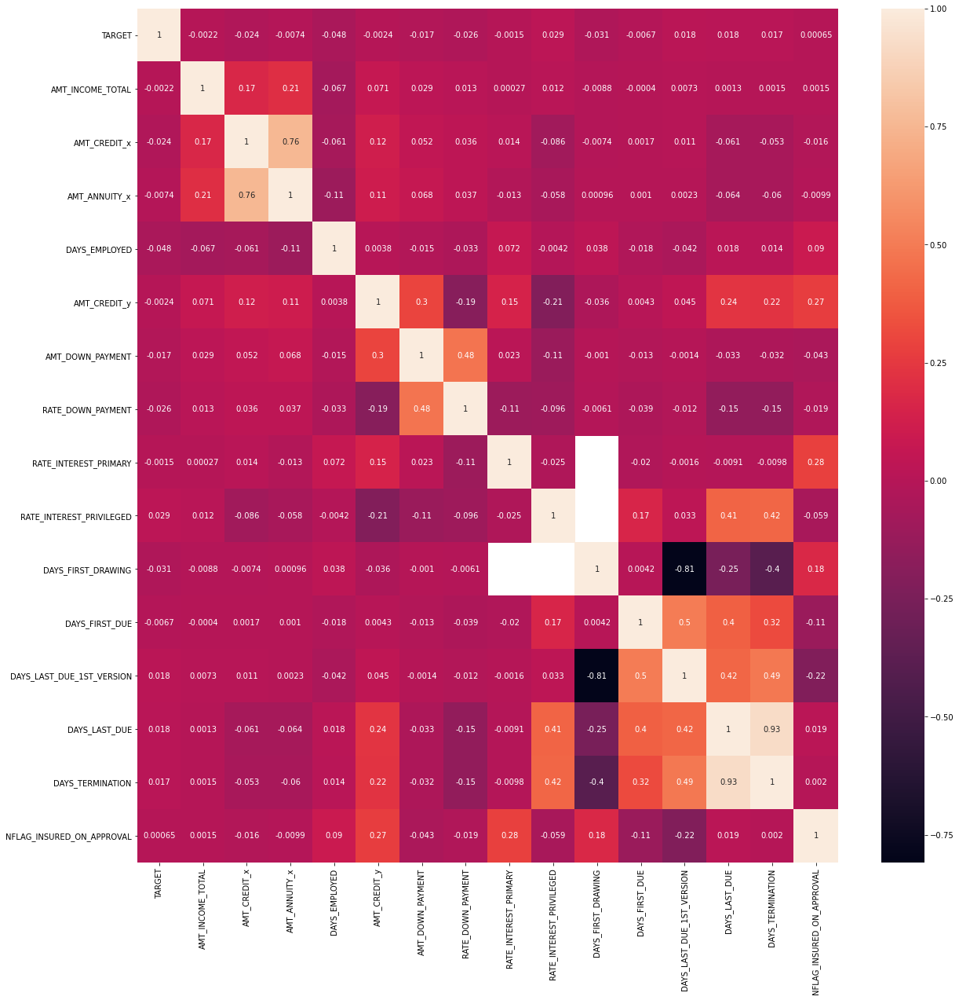

In [309]:
#Continuous Variables for combined data:
# Heatmap
plt.figure(figsize = (20,20))
corr_mat = new_res.corr()
sns.heatmap(corr_mat, annot =True)
plt.show()